In [63]:
! pip install scikeras

In [1]:
import pandas as pd
import numpy as np
import os
import time
import glob
from random import sample

from scipy.io import wavfile, savemat
from scipy.fft import fft, fftfreq
from scipy import signal
from scipy.fft import fftshift
from scipy.io import loadmat
from sklearn.model_selection import train_test_split

from IPython.display import Audio, display
from IPython.display import clear_output

import librosa
import mne
import pymatreader
import yasa
import seaborn as sns
import pyxdf

from mne.time_frequency import psd_array_multitaper
from keras.callbacks import ModelCheckpoint
from mne.decoding import CSP
from scipy.integrate import simps
from yasa import sliding_window
from lazypredict.Supervised import LazyClassifier

import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
# %matplotlib qt

%matplotlib inline
import plotly.io as pio
pio.renderers.default='notebook'

/home/shivam/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/home/shivam/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package yasa is out of date. Your version is 0.6.1, the latest is 0.6.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
2023-03-16 17:42:49.155097: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-16 17:42:49.457861: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see

In [5]:
from EEGModels import EEGNet, ShallowConvNet, DeepConvNet
import tensorflow as tf

In [6]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# Segregating the Data

In [2]:
def get_trials():
    trial_ctr_dict = {}
    for x in events[1].keys():
        if "ActionBeg" in x:
            trial_ctr_dict[x[10:]] = 0
        elif "FixBeg" in x:
            trial_ctr_dict[x[7:]] = 0
    return trial_ctr_dict

In [4]:
def get_event_info(marker_stream):
    # Get event info
    event_time = {"Name": [], "StartTime": [], "EndTime": [], "handPos": [], "Hand": [], "Action": []}
    for idx in range(len(marker_stream[0])):
        marker_list = marker_stream[0][idx][2]
        marker = list(marker_stream[1].keys())[list(marker_stream[1].values()).index(marker_list)]
        if "ActionBeg" in marker:
            start_time = marker_stream[0][idx][0]
            end_time = marker_stream[0][idx+1][0]
            action_name = marker[10:]
            event_time["Name"].append(action_name)
            event_time["StartTime"].append(start_time)
            event_time["EndTime"].append(end_time)
            event_time["handPos"].append(action_name.split("-")[0])
            event_time["Hand"].append(action_name.split("-")[1])
            event_time["Action"].append(action_name.split("-")[2])
    return event_time

In [10]:
def save_time_series_as_df(event_time, eeg_data, file_name):
    eeg_df = []
    channels = np.array([[x] for x in arr.ch_names])
    trial_ctr_dict = get_trials()
    for ts in range(len(event_time["Name"])):
        p_eeg  = eeg_data.iloc[event_time["StartTime"][ts] - 25: event_time["StartTime"][ts] + 500, 1:].T
        handPos = np.array([[event_time["handPos"][ts]]] * 64)
        Hand = np.array([[event_time["Hand"][ts]]] * 64)
        Action = np.array([[event_time["Action"][ts]]] * 64)
        Subject = np.array([[file_name[:-4]]] * 64)
        trial_type = event_time["handPos"][ts] + "-" + event_time["Hand"][ts] + "-" + event_time["Action"][ts]
        trial_ctr_dict[trial_type] += 1
        Trial = np.array([[trial_ctr_dict[trial_type]]] * 64)

        p_eeg = np.append(p_eeg, handPos, axis=1)
        p_eeg = np.append(p_eeg, Hand, axis=1)
        p_eeg = np.append(p_eeg, Action, axis=1)
        p_eeg = np.append(p_eeg, Subject, axis=1)
        p_eeg = np.append(p_eeg, channels, axis=1)
        p_eeg = np.append(p_eeg, Trial, axis=1)

        if len(eeg_df) == 0:
            eeg_df = p_eeg
        else: 
            eeg_df = np.concatenate((eeg_df, p_eeg), axis=0)
            # Resolve missing values here.
#             try:
#                 eeg_df = np.concatenate((eeg_df, p_eeg), axis=0)
#             except:
#                 print(p_eeg.shape, Subject, Hand, handPos, Trial, Action)

    return eeg_df 

In [12]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2/")
print("Current directory: ", os.getcwd())
data_files = glob.glob("*.set")
print("Files in current directory: ", data_files)
eeg_df_main = []
for file_name in ["FP05.set"]:
    print("Current file: ", file_name)
    arr = mne.io.read_raw_eeglab(file_name, verbose=0)
    eeg_data = arr.to_data_frame()
    events = mne.events_from_annotations(arr, verbose=0)
    event_time = get_event_info(events)
    eeg_df = save_time_series_as_df(event_time, eeg_data, file_name)
    print("Current file size: ", eeg_df.shape)
    if len(eeg_df_main) == 0:
        eeg_df_main = eeg_df
    else: 
        eeg_df_main = np.concatenate((eeg_df_main, eeg_df), axis=0)
    print(eeg_df_main.shape)

Current directory:  /mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2
Files in current directory:  ['P01.set', 'P03.set', 'FP03.set', 'FP05.set', 'FP09.set', 'FP10.set', 'FP01.set', 'FP07.set', 'FP11.set', 'P02.set', 'FP02.set', 'FP13.set', 'FP08.set', 'FP06.set', 'FP12.set']
Current file:  FP05.set
Current file size:  (30592, 531)


In [15]:
events

(array([[ 21102,      0,     29],
        [ 21347,      0,     41],
        [ 21348,      0,      4],
        ...,
        [454638,      0,     53],
        [455138,      0,     25],
        [455138,      0,     25]]),
 {'ActionBeg-palmDown-Left-Close': 1,
  'ActionBeg-palmDown-Left-Open': 2,
  'ActionBeg-palmDown-Right-Close': 3,
  'ActionBeg-palmDown-Right-Open': 4,
  'ActionBeg-palmIn-Left-Close': 5,
  'ActionBeg-palmIn-Left-Open': 6,
  'ActionBeg-palmIn-Right-Close': 7,
  'ActionBeg-palmIn-Right-Open': 8,
  'ActionBeg-palmUp-Left-Close': 9,
  'ActionBeg-palmUp-Left-Open': 10,
  'ActionBeg-palmUp-Right-Close': 11,
  'ActionBeg-palmUp-Right-Open': 12,
  'ActionEnd-palmDown-Left-Close': 13,
  'ActionEnd-palmDown-Left-Open': 14,
  'ActionEnd-palmDown-Right-Close': 15,
  'ActionEnd-palmDown-Right-Open': 16,
  'ActionEnd-palmIn-Left-Close': 17,
  'ActionEnd-palmIn-Left-Open': 18,
  'ActionEnd-palmIn-Right-Close': 19,
  'ActionEnd-palmIn-Right-Open': 20,
  'ActionEnd-palmUp-Left-Close': 2

In [ ]:
df = pd.DataFrame(eeg_df_main, columns=list(range(-100, 2000, 4))+["handPos", "Hand", "Action", "Subject", "Channel", "Trial"])
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
df.to_csv("cleaned_datav5.csv", index=False, header=list(range(-100, 2000, 4))+["handPos", "Hand", "Action", "Subject", "Channel", "Trial"])
df

# Reading segregated data for analysis

In [21]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [22]:
subjects = np.unique(dataset.Subject)
subjects

array(['FP01', 'FP02', 'FP03', 'FP05', 'FP06', 'FP07', 'FP08', 'FP09',
       'FP10', 'FP11', 'FP12', 'FP13', 'P01', 'P02', 'P03'], dtype=object)

In [23]:
grasp_labels = {"FixBeg": 0, "ActionBeg": 1}

In [49]:
# # 64 channel EEG data with 500 samples

# X, y = [], []
# nchan = 64
# # new_dataset = dataset[~(dataset["Subject"] == "P01")]
# iterations = len(dataset) // nchan
# for idx in range(iterations):
#     start = idx * nchan
#     end = (idx + 1) * nchan

#     X.append(np.expand_dims(dataset.iloc[start: end, :-7], 2))
#     y.append(grasp_labels[dataset.iloc[start, -1]])
# #     print(len(X), len(y))

# X = np.array(X)
# y = np.array(y)
# X.shape, y.shape

In [26]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2/")
arr = mne.io.read_raw_eeglab("P01.set", verbose=0)
channels = arr.ch_names#np.array([[x] for x in ])
events = mne.events_from_annotations(arr, verbose=0)
channels

['E1',
 'E2',
 'E3',
 'E4',
 'E5',
 'E6',
 'E7',
 'E8',
 'E9',
 'E10',
 'E11',
 'E12',
 'E13',
 'E14',
 'E15',
 'E16',
 'E17',
 'E18',
 'E19',
 'E20',
 'E21',
 'E22',
 'E23',
 'E24',
 'E25',
 'E26',
 'E27',
 'E28',
 'E29',
 'E30',
 'E31',
 'E32',
 'E33',
 'E34',
 'E35',
 'E36',
 'E37',
 'E38',
 'E39',
 'E40',
 'E41',
 'E42',
 'E43',
 'E44',
 'E45',
 'E46',
 'E47',
 'E48',
 'E49',
 'E50',
 'E51',
 'E52',
 'E53',
 'E54',
 'E55',
 'E56',
 'E57',
 'E58',
 'E59',
 'E60',
 'E61',
 'E62',
 'E63',
 'E64']

In [29]:
conditions_dict = {}
conds_trial_ctr = {}
for x in events[1].keys():
    if "ActionBeg" in x:
        conditions_dict[x[10:]] = []
        conds_trial_ctr[x[10:]] = 0
conditions_dict, conds_trial_ctr

({'palmDown-Left-Close': [],
  'palmDown-Left-Open': [],
  'palmDown-Right-Close': [],
  'palmDown-Right-Open': [],
  'palmIn-Left-Close': [],
  'palmIn-Left-Open': [],
  'palmIn-Right-Close': [],
  'palmIn-Right-Open': [],
  'palmUp-Left-Close': [],
  'palmUp-Left-Open': [],
  'palmUp-Right-Close': [],
  'palmUp-Right-Open': []},
 {'palmDown-Left-Close': 0,
  'palmDown-Left-Open': 0,
  'palmDown-Right-Close': 0,
  'palmDown-Right-Open': 0,
  'palmIn-Left-Close': 0,
  'palmIn-Left-Open': 0,
  'palmIn-Right-Close': 0,
  'palmIn-Right-Open': 0,
  'palmUp-Left-Close': 0,
  'palmUp-Left-Open': 0,
  'palmUp-Right-Close': 0,
  'palmUp-Right-Open': 0})

In [30]:
for subs in subjects:
    for palm in ["palmDown", "palmIn", "palmUp"]:
        for oc in ["Open", "Close"]:
            for hand in ["Left", "Right"]:
                for i in range(40):
                    test_sub_trial = dataset[
                        (dataset["handPos"] == palm) & 
                        (dataset["Action"] == oc) & 
                        (dataset["Hand"] == hand) & 
                        (dataset["Trial"] == i+1) & 
                        (dataset["Subject"] == subs)]
                    test_sub_trial.index = test_sub_trial.iloc[:, -2]
                    name = palm + "-" + hand + "-" + oc 
                    if len(conditions_dict[name]) > 0:
                        try:
                            conditions_dict[name] += test_sub_trial.iloc[:, :-7].to_numpy()
                        except:
                            pass
                    else:
                        conditions_dict[name] = test_sub_trial.iloc[:, :-7].to_numpy()

                    conds_trial_ctr[name] += 1
                    (name, test_sub_trial.shape, test_sub_trial)

In [32]:
cond_dict_avg = {}
for key in conditions_dict.keys():
    cond_dict_avg[key] = conditions_dict[key] / conds_trial_ctr[key]
cond_dict_avg

{'palmDown-Left-Close': array([[-0.08367678, -0.04351589, -0.02883768, ..., -0.20270683,
         -0.215936  , -0.2222425 ],
        [-0.00105706, -0.00833124, -0.00175068, ..., -0.12213529,
         -0.14173397, -0.16321407],
        [-0.02949233, -0.01677302,  0.00575034, ..., -0.096881  ,
         -0.11261908, -0.12534912],
        ...,
        [-0.13964561, -0.11163304, -0.0819518 , ..., -0.19628034,
         -0.2013007 , -0.1837845 ],
        [-0.06658814, -0.05123531, -0.0425463 , ...,  0.07187444,
          0.0898726 ,  0.07863493],
        [-0.05025428, -0.0366367 , -0.03692534, ...,  0.09955609,
          0.0774513 ,  0.06660625]]),
 'palmDown-Left-Open': array([[ 0.01565065, -0.03322019, -0.06475066, ..., -0.12408028,
         -0.18698974, -0.24049718],
        [-0.06081339, -0.03418034, -0.00402017, ..., -0.04157926,
         -0.04244992, -0.01914113],
        [-0.06871877, -0.05618483, -0.03545196, ..., -0.01830584,
         -0.01420413,  0.00543151],
        ...,
        [

In [68]:
subjects

array(['FP01', 'FP02', 'FP03', 'FP05', 'FP06', 'FP07', 'FP08', 'FP09',
       'FP10', 'FP11', 'FP12', 'FP13', 'P01', 'P02', 'P03'], dtype=object)

In [70]:
# Finding Standard Deviation

conditions_dict = {}
conds_trial_ctr = {}
for x in events[1].keys():
    if "ActionBeg" in x:
        conditions_dict[x[10:]] = []
        conds_trial_ctr[x[10:]] = 0
# conditions_dict, conds_trial_ctr

for subs in subjects:
    for palm in ["palmDown", "palmIn", "palmUp"]:
        for oc in ["Open", "Close"]:
            for hand in ["Left", "Right"]:
                for i in range(40):
                    test_sub_trial = dataset[
                        (dataset["handPos"] == palm) & 
                        (dataset["Action"] == oc) & 
                        (dataset["Hand"] == hand) & 
                        (dataset["Trial"] == i+1) & 
                        (dataset["Subject"] == subs)]
                    test_sub_trial.index = test_sub_trial.iloc[:, -2]
                    name = palm + "-" + hand + "-" + oc 
                    
                    try:
                        trial_diff = (test_sub_trial.iloc[:, :-7] - cond_dict_avg[name]) ** 2
                    except:
                        pass
                    
                    if len(conditions_dict[name]) > 0:
                        try:
                            conditions_dict[name] += trial_diff.to_numpy()
                        except:
                            pass
                    else:
                        conditions_dict[name] = trial_diff.to_numpy()

                    conds_trial_ctr[name] += 1
                    (name, test_sub_trial.shape, test_sub_trial)


In [75]:
cond_dict_std = {}
for key in conditions_dict.keys():
    cond_dict_std[key] = (conditions_dict[key] / conds_trial_ctr[key]) ** 0.5
cond_dict_std

{'palmDown-Left-Close': array([[1.27592578, 1.15830774, 1.07889386, ..., 4.0907985 , 3.97275412,
         3.82940162],
        [1.1868932 , 1.0849025 , 1.02517447, ..., 1.99442768, 2.01485398,
         2.00809935],
        [1.20878276, 1.10750047, 1.03795886, ..., 2.0393122 , 2.03558378,
         2.01541314],
        ...,
        [1.26829277, 1.15797267, 1.07551444, ..., 2.95372463, 2.99964405,
         2.96950011],
        [1.2397817 , 1.1218713 , 1.0484327 , ..., 3.33136246, 3.46286902,
         3.53976325],
        [1.2947928 , 1.16027613, 1.07764306, ..., 3.60287944, 3.725419  ,
         3.79917707]]),
 'palmDown-Left-Open': array([[1.22800825, 1.11295919, 1.06139671, ..., 3.68545631, 3.70975526,
         3.70577481],
        [1.20697223, 1.06583094, 1.01747242, ..., 2.07139857, 2.11136961,
         2.14091963],
        [1.16349952, 1.0722621 , 1.03402092, ..., 2.09067452, 2.12193367,
         2.17501811],
        ...,
        [1.22130547, 1.09994199, 1.07325569, ..., 2.89719858, 2

# ANOVA Analysis

3-way anova for 3 factors (hand, action, position). 

We will find the F-score for all participants, channels, and time-points.

We will take mean and standard deviation of the 40 trials.

In [87]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [88]:
subjects = np.unique(dataset["Subject"])
channels = np.unique(dataset["Channel"])
subjects, channels

(array(['FP01', 'FP02', 'FP03', 'FP05', 'FP06', 'FP07', 'FP08', 'FP09',
        'FP10', 'FP11', 'FP12', 'FP13', 'P01', 'P02', 'P03'], dtype=object),
 array(['E1', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E17',
        'E18', 'E19', 'E2', 'E20', 'E21', 'E22', 'E23', 'E24', 'E25',
        'E26', 'E27', 'E28', 'E29', 'E3', 'E30', 'E31', 'E32', 'E33',
        'E34', 'E35', 'E36', 'E37', 'E38', 'E39', 'E4', 'E40', 'E41',
        'E42', 'E43', 'E44', 'E45', 'E46', 'E47', 'E48', 'E49', 'E5',
        'E50', 'E51', 'E52', 'E53', 'E54', 'E55', 'E56', 'E57', 'E58',
        'E59', 'E6', 'E60', 'E61', 'E62', 'E63', 'E64', 'E7', 'E8', 'E9'],
       dtype=object))

In [86]:
for chan in channels:
    time_series = dataset[dataset["Channel"] == chan]
    print(time_series.shape)
#     for time in range(200):
        

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
0       0.99  1.05  0.82  0.45  0.17  0.09  0.19  0.33  0.45  0.57  ...  0.90   
64      0.68  0.55  0.74  1.26  1.71  1.57  0.68 -0.59 -1.58 -1.90  ... -5.00   
128    -1.30 -1.86 -1.51 -0.82 -0.29  0.00  0.34  0.87  1.32  1.26  ...  6.97   
192    -0.07 -1.27 -2.07 -1.96 -1.01  0.18  0.93  0.86  0.16 -0.65  ... -5.41   
256     0.36  0.71  1.19  1.54  1.41  0.87  0.40  0.39  0.74  0.98  ...  2.81   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460288 -2.26 -1.62 -0.73 -0.05  0.17  0.10  0.12  0.37  0.64  0.54  ...  4.35   
460352 -1.67 -1.54 -0.83 -0.16 -0.12 -0.75 -1.46 -1.61 -1.03 -0.12  ... -1.88   
460416  3.44  2.19  0.82 -0.19 -0.57 -0.40  0.02  0.35  0.41  0.20  ...  0.64   
460480 -1.54 -1.59 -1.15 -0.57 -0.32 -0.60 -1.18 -1.52 -1.19 -0.19  ... -0.56   
460544 -1.52 -1.00 -0.18  0.62  1.22  1.45  1.24  0.65 -0.11 -0.76  ...  0.01   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
15     -0.06 -0.32 -0.59 -0.66 -0.52 -0.34 -0.32 -0.50 -0.77 -0.95  ...  3.61   
79      0.04 -0.05 -0.27 -0.57 -0.80 -0.81 -0.51  0.02  0.55  0.80  ... -0.06   
143     0.53  0.89  1.14  1.10  0.75  0.27 -0.05  0.01  0.41  0.83  ... -0.96   
207     0.34  0.68  0.89  0.72  0.20 -0.45 -0.93 -1.13 -1.05 -0.80  ...  1.83   
271    -0.61 -0.51 -0.34 -0.25 -0.30 -0.51 -0.83 -1.18 -1.42 -1.42  ... -2.10   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460303 -0.02  0.60  0.39 -0.36 -1.18 -1.72 -1.88 -1.70 -1.28 -0.68  ...  1.19   
460367  0.07  0.34  0.56  0.63  0.47  0.05 -0.50 -0.93 -0.99 -0.58  ...  0.90   
460431  0.01 -0.77 -1.00 -0.64  0.02  0.56  0.65  0.24 -0.46 -1.09  ... -0.64   
460495  0.01 -0.02  0.43  1.22  1.90  2.03  1.54  0.73  0.04 -0.27  ... -1.17   
460559  2.13  1.51  0.73  0.04 -0.45 -0.72 -0.73 -0.48 -0.03  0.47  ...  1.07   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
22      0.28 -0.02 -0.87 -1.67 -1.85 -1.15  0.21  1.52  2.05  1.49  ... -4.20   
86     -0.21 -0.26 -0.22 -0.06  0.09  0.08 -0.04 -0.03  0.40  1.21  ...  4.13   
150     1.19  0.85  0.39  0.18  0.31  0.52  0.52  0.30  0.10  0.15  ... -3.71   
214     2.42  1.00 -0.73 -1.99 -2.22 -1.48 -0.36  0.47  0.70  0.51  ...  6.20   
278     0.36  0.79  1.19  1.32  1.12  0.67  0.18 -0.08  0.06  0.58  ...  0.17   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460310  1.00 -0.04 -1.28 -2.02 -1.89 -1.15 -0.36  0.09  0.32  0.64  ... -3.30   
460374 -1.66 -1.71 -1.14 -0.30  0.32  0.56  0.54  0.45  0.37  0.18  ...  3.24   
460438  1.45  1.87  1.90  1.37  0.39 -0.68 -1.37 -1.42 -0.87 -0.05  ... -0.91   
460502  1.14  1.99  1.82  0.86 -0.17 -0.55 -0.10  0.72  1.14  0.72  ... -3.39   
460566 -0.51 -0.75 -0.87 -0.95 -1.07 -1.20 -1.21 -0.94 -0.41  0.14  ... -0.27   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
29     -1.92 -0.99  0.17  1.16  1.56  1.29  0.68  0.21  0.15  0.37  ... -4.09   
93     -0.96 -0.63 -0.64 -0.90 -1.13 -1.15 -0.96 -0.71 -0.49 -0.18  ...  0.78   
157     2.08  2.50  2.06  1.11  0.22 -0.28 -0.44 -0.52 -0.73 -0.97  ... -0.35   
221    -1.11 -1.75 -1.47 -0.53  0.55  1.35  1.75  1.79  1.56  1.15  ...  1.23   
285     1.36  0.92  0.39 -0.10 -0.26  0.00  0.40  0.51  0.14 -0.54  ...  6.78   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460317  0.59  0.64  0.90  1.22  1.38  1.26  0.83  0.27 -0.15 -0.25  ... -1.05   
460381 -0.36 -0.55 -0.53 -0.41 -0.21  0.12  0.65  1.24  1.56  1.31  ... -0.07   
460445 -0.95 -0.35 -0.47 -0.92 -1.14 -0.83 -0.14  0.46  0.58  0.19  ...  1.33   
460509 -0.97 -0.38  0.74  1.66  1.71  0.87 -0.23 -0.83 -0.73 -0.38  ... -0.14   
460573 -0.52 -0.91 -1.47 -1.69 -1.28 -0.37  0.52  1.00  1.04  0.92  ... -0.49   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
37     -1.47 -1.18 -0.83 -0.56 -0.51 -0.74 -1.16 -1.53 -1.58 -1.19  ...  1.20   
101    -1.63 -1.37 -0.94 -0.44  0.05  0.44  0.60  0.48  0.16 -0.03  ... -0.60   
165     1.22  1.41  0.99  0.12 -0.83 -1.47 -1.68 -1.63 -1.55 -1.52  ...  1.08   
229     0.43  0.54  0.10 -0.34 -0.46 -0.23  0.17  0.52  0.71  0.71  ... -1.91   
293    -0.29 -0.20  0.14  0.54  0.90  1.25  1.60  1.81  1.64  0.96  ... -0.32   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460325  2.28  0.86 -0.33 -0.79 -0.64 -0.43 -0.56 -0.84 -0.72  0.03  ... -2.24   
460389 -0.77 -0.65 -0.48 -0.30 -0.15 -0.03  0.05  0.15  0.31  0.49  ...  0.03   
460453 -2.09 -1.37 -0.63 -0.11  0.20  0.51  1.01  1.62  2.00  1.82  ...  0.34   
460517 -0.61 -0.29 -0.27 -0.50 -0.59 -0.22  0.43  0.79  0.40 -0.66  ...  2.90   
460581 -1.52 -1.21 -0.49  0.10  0.23  0.05  0.00  0.31  0.75  0.95  ...  0.30   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
42     -0.72  0.08  0.77  0.88  0.42 -0.14 -0.48 -0.64 -0.85 -1.10  ... -1.64   
106     0.47  0.01  0.10  0.68  1.28  1.44  1.07  0.46  0.01 -0.10  ...  0.57   
170     0.63  0.14 -0.18 -0.24 -0.29 -0.64 -1.36 -2.12 -2.42 -1.95  ...  3.62   
234     0.24  0.61  0.78  0.84  0.93  1.10  1.25  1.14  0.68 -0.06  ... -0.87   
298    -0.48 -0.40 -0.89 -1.57 -1.77 -1.17 -0.13  0.62  0.59 -0.07  ...  1.11   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460330  0.58 -0.84 -1.47 -0.89  0.31  1.10  0.91  0.22  0.01  0.77  ... -0.23   
460394 -0.18  0.30  0.34 -0.03 -0.35 -0.16  0.47  1.03  1.10  0.70  ...  0.67   
460458 -1.03 -0.18 -0.08 -0.47 -0.74 -0.53  0.03  0.49  0.58  0.42  ...  0.49   
460522  0.30 -0.18 -0.80 -1.15 -0.97 -0.36  0.27  0.48  0.08 -0.73  ...  0.82   
460586 -2.11 -1.69 -0.64  0.38  0.95  1.09  1.02  0.84  0.50  0.04  ...  0.34   

        1988  1

(7197, 531)         -100   -96   -92   -88   -84   -80   -76   -72   -68   -64  ...  1984  \
49     -1.74 -1.97 -1.63 -1.04 -0.63 -0.58 -0.75 -0.79 -0.50  0.01  ...  2.61   
113     1.05  0.90  0.95  0.91  0.61  0.12 -0.27 -0.38 -0.25 -0.12  ...  0.02   
177    -2.03 -2.00 -1.45 -0.80 -0.32 -0.01  0.27  0.53  0.66  0.52  ...  2.27   
241    -2.15 -0.79  0.32  0.69  0.27 -0.54 -1.12 -1.03 -0.30  0.55  ... -5.44   
305     0.04 -0.06 -0.02  0.20  0.48  0.59  0.41 -0.04 -0.66 -1.33  ...  0.47   
...      ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
460337 -0.14  0.41  0.88  1.04  0.73  0.10 -0.48 -0.80 -0.91 -1.03  ... -0.23   
460401  1.12  0.95  0.47 -0.22 -0.95 -1.47 -1.64 -1.43 -0.90 -0.18  ...  0.31   
460465 -2.27 -2.29 -1.48 -0.48  0.08  0.05 -0.25 -0.40 -0.20  0.28  ...  0.34   
460529 -1.14 -1.18 -1.03 -0.92 -0.89 -0.74 -0.33  0.27  0.80  1.08  ...  2.18   
460593  0.39  1.65  2.53  2.54  1.65  0.35 -0.67 -0.98 -0.68 -0.21  ...  0.64   

        1988  1

KeyboardInterrupt: 

In [36]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2/")
arr = mne.io.read_raw_eeglab("P01.set", verbose=0)
events = mne.events_from_annotations(arr, verbose=0)

conditions_dict = {}
conds_trial_ctr = {}
for x in events[1].keys():
    if "ActionBeg" in x:
        conditions_dict[x[10:]] = []
        conds_trial_ctr[x[10:]] = 0
conditions_dict, conds_trial_ctr

({'palmDown-Left-Close': [],
  'palmDown-Left-Open': [],
  'palmDown-Right-Close': [],
  'palmDown-Right-Open': [],
  'palmIn-Left-Close': [],
  'palmIn-Left-Open': [],
  'palmIn-Right-Close': [],
  'palmIn-Right-Open': [],
  'palmUp-Left-Close': [],
  'palmUp-Left-Open': [],
  'palmUp-Right-Close': [],
  'palmUp-Right-Open': []},
 {'palmDown-Left-Close': 0,
  'palmDown-Left-Open': 0,
  'palmDown-Right-Close': 0,
  'palmDown-Right-Open': 0,
  'palmIn-Left-Close': 0,
  'palmIn-Left-Open': 0,
  'palmIn-Right-Close': 0,
  'palmIn-Right-Open': 0,
  'palmUp-Left-Close': 0,
  'palmUp-Left-Open': 0,
  'palmUp-Right-Close': 0,
  'palmUp-Right-Open': 0})

In [77]:
import pandas as pd  
import matplotlib.pyplot as plt  
import statsmodels 
from statsmodels.formula.api import ols  
import seaborn as sns  
import numpy as np  
import pandas.tseries  
plt.style.use('fivethirtyeight')  

In [79]:
def rm_anova_input_fn(trial):
    for palm in ["palmDown", "palmIn", "palmUp"]:
        for hand in ["Left", "Right"]:
            for oc in ["Open", "Close"]:
                key = palm+"-"+hand+"-"+oc
                conditions_dict[key] = list(trial[
                    (trial["handPos"] == palm) & 
                    (trial["Hand"] == hand) & 
                    (trial["Action"] == oc)
                ].iloc[:, 0])
    return pd.DataFrame(conditions_dict, columns=conditions_dict.keys(), index=range(40), dtype=np.float64)

In [83]:
for sub in subjects:
    for chan in channels:
        time_series = dataset[(dataset["Subject"] == sub ) & (dataset["Channel"] == chan)]
        for time in range(200):
            
            trial = time_series.iloc[:, [time] + list(range(525, 531))]
            rm_anova_input = rm_anova_input_fn(trial)
#             print(rm_anova_input.shape)
            results = statsmodels.stats.anova.AnovaRM(rm_anova_input, depvar="Action", subject=sub)
            print(results)

TypeError: argument of type 'NoneType' is not iterable

In [55]:
trial

,-100,handPos,Hand,Action,Subject,Channel,Trial
307025,-1.77,palmUp,Right,Open,FP02,E18,1
307089,-0.47,palmUp,Left,Open,FP02,E18,1
307153,0.18,palmUp,Right,Close,FP02,E18,1
307217,1.30,palmUp,Left,Close,FP02,E18,1
307281,0.98,palmUp,Right,Open,FP02,E18,2
...,...,...,...,...,...,...,...
337425,1.19,palmIn,Right,Close,FP02,E18,39
337489,-1.21,palmIn,Left,Open,FP02,E18,40
337553,-0.32,palmIn,Right,Open,FP02,E18,40
337617,0.42,palmIn,Left,Close,FP02,E18,40


In [48]:
len(conditions_dict["palmDown-Right-Close"])

0

In [71]:
conditions_dict

{'palmDown-Left-Close': 317457   -0.25
 317713    0.56
 317841   -0.26
 318161   -0.40
 318481    0.82
 318737    1.39
 318865   -1.12
 319185    1.17
 319505   -0.80
 319761   -1.30
 319889    0.63
 320209   -0.62
 320529    1.04
 320785   -0.32
 320913    1.06
 321233   -0.27
 321553   -1.27
 321809   -0.23
 321937   -0.06
 322257   -1.17
 322577   -1.77
 322833   -0.62
 322961   -0.70
 323281    0.68
 323601   -0.73
 323857    1.42
 323985    0.80
 324305    0.99
 324625    1.76
 324881    1.20
 325009   -0.25
 325329    0.32
 325649   -0.47
 325905   -2.07
 326033   -1.43
 326353    0.15
 326673    1.48
 326929   -1.09
 327057    1.35
 327377   -0.28
 Name: -100, dtype: float64,
 'palmDown-Left-Open': 317329    0.07
 317649   -0.06
 317777   -0.29
 318033   -0.93
 318353   -1.53
 318673    0.75
 318801    1.30
 319057    0.16
 319377    1.49
 319697   -1.34
 319825    0.22
 320081   -2.34
 320401    1.28
 320721    0.52
 320849   -0.58
 321105    1.36
 321425   -0.25
 321745    0.7

In [ ]:
'''
for subs in subjects:
    for palm in ["palmDown", "palmIn", "palmUp"]:
        for oc in ["Open", "Close"]:
            for hand in ["Left", "Right"]:
                for i in range(40):
                    test_sub_trial = dataset[
                        (dataset["handPos"] == palm) & 
                        (dataset["Action"] == oc) & 
                        (dataset["Hand"] == hand) & 
                        (dataset["Trial"] == i+1) & 
                        (dataset["Subject"] == subs)]
                    test_sub_trial.index = test_sub_trial.iloc[:, -2]
                    name = palm + "-" + hand + "-" + oc 
                    if len(conditions_dict[name]) > 0:
                        try:
                            conditions_dict[name] += test_sub_trial.iloc[:, :-7].to_numpy()
                        except:
                            pass
                    else:
                        conditions_dict[name] = test_sub_trial.iloc[:, :-7].to_numpy()

                    conds_trial_ctr[name] += 1
                    (name, test_sub_trial.shape, test_sub_trial)
'''

# 1. Topomaps for 12 conditions

In [ ]:
chanloc = "/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/ChannelLocations/EGIAmpServer64Chan.loc"
chans = mne.channels.read_custom_montage(chanloc)
channels = [f'E{n:1}' for n in range(1, 65)]
info = mne.create_info(channels, sfreq=250, ch_types="eeg")
info.set_montage(chans)
info

In [ ]:
max_eeg, min_eeg = np.NINF, np.inf  
for key in cond_dict_avg.keys():
    if np.amax(cond_dict_avg[key]) > max_eeg:
        max_eeg = np.amax(cond_dict_avg[key])
    
    if np.amin(cond_dict_avg[key]) < min_eeg:
        min_eeg = np.amin(cond_dict_avg[key])

max_eeg, min_eeg

In [ ]:
cond_dict_norm = {}
for key in cond_dict_avg.keys():
    cond_dict_norm[key] = (cond_dict_avg[key] - min_eeg) / (max_eeg - min_eeg) 
cond_dict_norm

In [ ]:
for key in cond_dict_avg.keys():
    evoked = mne.EvokedArray(cond_dict_avg[key], info, baseline=None)
    evoked.plot_topomap(ch_type='eeg', title=key)

In [33]:
times = np.arange(0.05, 0.996, 0.01)
fig, anim = right_close_in_evoked.animate_topomap(
    times=times, ch_type='eeg', frame_rate=22, blit=False)

Initializing animation...
Initializing animation...


In [34]:
# anim.save("InRightOpen.gif")

18-Jan-23 12:47:20 | WARNING | MovieWriter ffmpeg unavailable; using Pillow instead.


Initializing animation...


In [19]:
os.getcwd()

'/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2'

# 2. ERP Analysis (all subjects)

In [38]:
for key in cond_dict_avg.keys():
    fig = px.line(pd.DataFrame(cond_dict_avg[key][:, 25:175].T, 
                               index=list(range(0, 600, 4)), 
                               columns=channels), 
                  title=key
                 )
    fig.show()

In [145]:
chan = 28
single_chan_df = {}
for key in cond_dict_avg.keys():
    single_chan_df[key] = cond_dict_avg[key][chan, : 175].T
single_chan_df = pd.DataFrame(single_chan_df)
single_chan_df

,palmDown-Left-Close,palmDown-Left-Open,palmDown-Right-Close,palmDown-Right-Open,palmIn-Left-Close,palmIn-Left-Open,palmIn-Right-Close,palmIn-Right-Open,palmUp-Left-Close,palmUp-Left-Open,palmUp-Right-Close,palmUp-Right-Open
0,0.03,0.11,-0.02,0.03,-0.08,0.05,-0.06,0.01,0.07,-0.04,0.02,0.01
1,0.03,0.13,-0.04,0.07,-0.08,-0.01,-0.05,-0.00,0.01,-0.02,0.01,0.03
2,0.00,0.10,-0.05,0.10,-0.08,-0.05,-0.04,-0.01,-0.06,0.00,0.03,0.05
3,-0.03,0.05,-0.04,0.12,-0.07,-0.04,-0.03,-0.01,-0.10,0.01,0.04,0.06
4,-0.05,-0.02,-0.04,0.11,-0.04,-0.02,-0.05,-0.01,-0.08,0.02,0.04,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...
170,-0.06,-0.03,0.25,0.23,0.18,0.33,0.09,0.07,-0.02,0.12,0.03,0.17
171,-0.04,-0.03,0.29,0.22,0.17,0.37,0.10,0.04,-0.00,0.11,0.07,0.15
172,-0.04,-0.02,0.30,0.22,0.18,0.37,0.09,0.05,0.01,0.10,0.11,0.13
173,-0.05,0.01,0.30,0.24,0.21,0.32,0.07,0.09,0.03,0.11,0.14,0.12


In [146]:
folder = "P3-28-open-vs-close"
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Plots/")
os.mkdir(folder)
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Plots/"+folder)

for i in range(6):
    keys = single_chan_df.keys()[[2*i, 2*i+1]]
    title = str(keys[0] + ' vs. ' + keys[1] + ' channel: ' + str(chan))
    fig = px.line(single_chan_df, 
              y=keys,
              title=title
             )
#     fig.write_image(title + ".png") 
    fig.show()

In [106]:
chan = 12
single_chan_df_std = {}
for key in cond_dict_std.keys():
    single_chan_df_std[key] = cond_dict_std[key][chan, : 175].T
single_chan_df_std = pd.DataFrame(single_chan_df_std)
single_chan_df_std

,palmDown-Left-Close,palmDown-Left-Open,palmDown-Right-Close,palmDown-Right-Open,palmIn-Left-Close,palmIn-Left-Open,palmIn-Right-Close,palmIn-Right-Open,palmUp-Left-Close,palmUp-Left-Open,palmUp-Right-Close,palmUp-Right-Open
0,1.19,1.16,1.18,1.16,1.15,1.15,1.14,1.14,1.14,1.16,1.16,1.18
1,1.13,1.07,1.09,1.07,1.06,1.09,1.07,1.08,1.08,1.04,1.05,1.07
2,1.06,1.02,1.03,1.02,1.04,1.06,1.04,1.07,1.04,1.00,0.99,1.02
3,0.99,1.00,1.00,0.99,1.03,1.02,1.01,1.04,1.01,1.03,0.99,1.02
4,0.96,1.01,0.98,1.01,1.02,0.98,0.99,1.03,0.99,1.05,1.02,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...
170,1.92,2.05,2.12,2.04,2.07,1.97,2.01,1.87,1.87,1.85,2.19,2.08
171,1.96,2.09,2.10,2.02,2.03,1.98,2.03,1.86,1.87,1.85,2.18,2.06
172,1.97,2.09,2.13,2.04,1.97,2.01,2.02,1.84,1.90,1.87,2.21,2.02
173,1.97,2.07,2.19,2.05,1.91,2.01,2.02,1.83,1.92,1.88,2.24,1.97


In [107]:
single_chan_df_std[keys]

,palmUp-Right-Close,palmUp-Right-Open
0,1.16,1.18
1,1.05,1.07
2,0.99,1.02
3,0.99,1.02
4,1.02,1.00
...,...,...
170,2.19,2.08
171,2.18,2.06
172,2.21,2.02
173,2.24,1.97


In [116]:
fig = go.Figure([
    go.Scatter(
        name='Comparision Graph',
        y=single_chan_df["palmUp-Right-Close"],
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='Upper Bound',
        y=single_chan_df["palmUp-Right-Close"] + (single_chan_df_std["palmUp-Right-Close"]/2),
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        y=single_chan_df["palmUp-Right-Close"] - (single_chan_df_std["palmUp-Right-Close"]/2),
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
])
fig.update_layout(
    yaxis_title='Voltage',
    title='Continuous, variable value error bars',
    hovermode="x"
)
fig.show()

<!-- 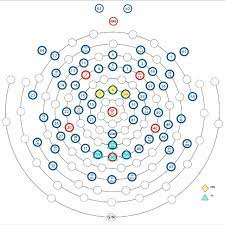 -->
<div>
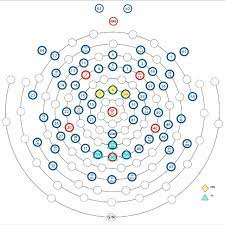
</div>


# 3. ERP Plots (subject-wise) 

In [3]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [8]:
subjects = np.unique(dataset["Subject"])
subjects

array(['FP01', 'FP02', 'FP03', 'FP05', 'FP06', 'FP07', 'FP08', 'FP09',
       'FP10', 'FP11', 'FP12', 'FP13', 'P01', 'P02', 'P03'], dtype=object)

In [7]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/PreprocessedData/Preprocessedv2/")
arr = mne.io.read_raw_eeglab("P01.set", verbose=0)
channels = arr.ch_names#np.array([[x] for x in ])
events = mne.events_from_annotations(arr, verbose=0)
print(channels)

['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E17', 'E18', 'E19', 'E20', 'E21', 'E22', 'E23', 'E24', 'E25', 'E26', 'E27', 'E28', 'E29', 'E30', 'E31', 'E32', 'E33', 'E34', 'E35', 'E36', 'E37', 'E38', 'E39', 'E40', 'E41', 'E42', 'E43', 'E44', 'E45', 'E46', 'E47', 'E48', 'E49', 'E50', 'E51', 'E52', 'E53', 'E54', 'E55', 'E56', 'E57', 'E58', 'E59', 'E60', 'E61', 'E62', 'E63', 'E64']


In [31]:
conditions_dict = {}
conds_trial_ctr = {}
for x in events[1].keys():
    if "ActionBeg" in x:
        conditions_dict[x[10:]] = []
        conds_trial_ctr[x[10:]] = 0

# for subs in subjects[:1]:
subs = "FP01"
for palm in ["palmDown", "palmIn", "palmUp"]:
    for oc in ["Open", "Close"]:
        for hand in ["Left", "Right"]:
            for i in range(40):
                test_sub_trial = dataset[
                    (dataset["handPos"] == palm) & 
                    (dataset["Action"] == oc) & 
                    (dataset["Hand"] == hand) & 
                    (dataset["Trial"] == i+1) & 
                    (dataset["Subject"] == subs)]
                test_sub_trial.index = test_sub_trial.iloc[:, -2]
                name = palm + "-" + hand + "-" + oc 
                conds_trial_ctr[name] += 1
                if len(conditions_dict[name]) > 0:
                    try:
                        conditions_dict[name] += test_sub_trial.iloc[:, :-7].to_numpy()
                    except:
                        pass
                else:
                    conditions_dict[name] = test_sub_trial.iloc[:, :-7].to_numpy()                

(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)
(64, 531)


In [32]:
conditions_dict, conds_trial_ctr

({'palmDown-Left-Close': array([[-11.05801125, -12.48740089, -11.24910943, ...,   6.13507513,
            1.36877065,   2.12353537],
         [  0.23330679,  -3.02518086,  -2.09129613, ...,  -0.34344576,
           -4.85832454,  -7.84890278],
         [  3.40434485,   3.66150657,   4.10109602, ..., -14.14514204,
          -16.43227226, -12.41127471],
         ...,
         [-12.82671369, -12.83393574, -10.05653113, ..., -21.09940375,
          -30.08104707, -29.57577577],
         [-21.28024819, -16.41253825, -11.63316235, ..., -40.72286681,
          -58.31637449, -66.86065431],
         [-24.63495854, -19.42786258, -13.9448484 , ..., -39.45999971,
          -56.46035248, -66.48953772]]),
  'palmDown-Left-Open': array([[-15.81561508, -14.78539429, -11.90636165, ...,   7.65202334,
            6.15918709,   4.93767457],
         [-11.50140962, -13.3179741 ,  -9.54970868, ...,   9.50920694,
            9.51107043,   8.08393152],
         [ -4.16251251,  -4.74473122,  -4.95149675, ...,  1

In [33]:
cond_dict_avg = {}
for key in conditions_dict.keys():
    cond_dict_avg[key] = conditions_dict[key] / conds_trial_ctr[key]
cond_dict_avg

{'palmDown-Left-Close': array([[-0.27645028, -0.31218502, -0.28122774, ...,  0.15337688,
          0.03421927,  0.05308838],
        [ 0.00583267, -0.07562952, -0.0522824 , ..., -0.00858614,
         -0.12145811, -0.19622257],
        [ 0.08510862,  0.09153766,  0.1025274 , ..., -0.35362855,
         -0.41080681, -0.31028187],
        ...,
        [-0.32066784, -0.32084839, -0.25141328, ..., -0.52748509,
         -0.75202618, -0.73939439],
        [-0.5320062 , -0.41031346, -0.29082906, ..., -1.01807167,
         -1.45790936, -1.67151636],
        [-0.61587396, -0.48569656, -0.34862121, ..., -0.98649999,
         -1.41150881, -1.66223844]]),
 'palmDown-Left-Open': array([[-0.39539038, -0.36963486, -0.29765904, ...,  0.19130058,
          0.15397968,  0.12344186],
        [-0.28753524, -0.33294935, -0.23874272, ...,  0.23773017,
          0.23777676,  0.20209829],
        [-0.10406281, -0.11861828, -0.12378742, ...,  0.46994107,
          0.44836302,  0.37651788],
        ...,
        [

In [35]:
for key in cond_dict_avg.keys():
    fig = px.line(pd.DataFrame(cond_dict_avg[key][:, 25:175].T, 
                               index=list(range(0, 600, 4)), 
                               columns=channels), 
                  title=key+" FP01"
                 )
    fig.show()

In [36]:

single_chan_df

,palmDown-Left-Close,palmDown-Left-Open,palmDown-Right-Close,palmDown-Right-Open,palmIn-Left-Close,palmIn-Left-Open,palmIn-Right-Close,palmIn-Right-Open,palmUp-Left-Close,palmUp-Left-Open,palmUp-Right-Close,palmUp-Right-Open
0,-0.28,0.06,-0.01,-0.00,-0.06,-0.18,0.10,-0.05,-0.38,0.12,-0.33,-0.09
1,-0.29,0.05,-0.11,-0.00,0.08,-0.09,-0.03,-0.05,-0.08,0.10,-0.24,-0.02
2,-0.24,0.07,-0.15,-0.00,0.21,-0.02,-0.08,0.13,0.15,0.06,-0.05,0.01
3,-0.17,0.05,-0.12,0.00,0.28,0.02,-0.04,0.31,0.21,0.02,0.15,-0.06
4,-0.09,-0.06,-0.04,0.02,0.26,0.05,0.02,0.31,0.11,0.02,0.22,-0.17
...,...,...,...,...,...,...,...,...,...,...,...,...
170,0.23,-1.10,0.92,-0.01,-0.71,-0.75,0.29,0.24,-0.85,-0.30,0.07,0.38
171,0.19,-1.11,0.87,-0.11,-0.65,-0.71,0.16,0.16,-0.90,-0.43,-0.08,0.20
172,0.10,-1.11,0.78,-0.16,-0.68,-0.71,0.02,0.10,-0.79,-0.63,-0.24,-0.08
173,0.01,-1.09,0.66,-0.17,-0.74,-0.79,-0.10,0.10,-0.62,-0.78,-0.36,-0.36


In [43]:
chan = 60
single_chan_df = {}
for key in cond_dict_avg.keys():
    single_chan_df[key] = cond_dict_avg[key][chan, : 175].T
single_chan_df = pd.DataFrame(single_chan_df)

folder = "FP01-F4-60-open-vs-close"
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Plots/Subject-wise ERP")
os.mkdir(folder)
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Plots/Subject-wise ERP/"+folder)

for i in range(6):
    keys = single_chan_df.keys()[[2*i, 2*i+1]]
    title = str(keys[0] + ' vs. ' + keys[1] + ' channel: ' + str(chan))
    fig = px.line(single_chan_df, 
              y=keys,
              title=title
             )
    fig.write_image(title + ".png") 
    fig.show()

# 4. EEGNET Classification

In [4]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [32]:
bad_participants = ["FP01", "FP04", "FP10"]
new_dataset = dataset[lambda x: x["Subject"] in bad_participants]
new_dataset.shape

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [38]:
dataset[~dataset["Subject"].isin(bad_participants)].reset_index()

,index,-100,-96,-92,-88,-84,-80,-76,-72,-68,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399227,460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
399228,460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
399229,460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
399230,460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [41]:
# 64 channel EEG data with 500 samples
X, y_oc, y_lr = [], [], []
grasp_labels = {"Open": 0, "Close": 1}
hand_labels = {"Left": 0, "Right": 1}

new_dataset = dataset[~dataset["Subject"].isin(bad_participants)].reset_index()
nchan = 64
iterations = len(new_dataset) // nchan

# sample_range = 25, 175
for idx in range(iterations):
    start = idx * nchan
    end = (idx + 1) * nchan

    X.append(np.expand_dims(new_dataset.iloc[start: end, :175], 2))
    y_oc.append(grasp_labels[new_dataset.iloc[start, -4]])
    y_lr.append(hand_labels[new_dataset.iloc[start, -5]])

X = np.array(X)
y_oc = np.array(y_oc)
y_lr = np.array(y_lr)
X.shape, y_oc.shape, y_lr.shape

((6238, 64, 175, 1), (6238,), (6238,))

In [42]:
X_train, X_eval, y_train, y_eval = train_test_split(X, y_oc, test_size=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train.shape, X_eval.shape, X_test.shape, y_train.shape, y_eval.shape, y_test.shape

((5052, 64, 175, 1),
 (624, 64, 175, 1),
 (562, 64, 175, 1),
 (5052,),
 (624,),
 (562,))

In [44]:
# set a valid path for your system to record model checkpoints
checkpoint_filepath = "/tmp/checkpoint/"
checkpointer = ModelCheckpoint(
        filepath=checkpoint_filepath, 
        save_weights_only=True,
        monitor="val_accuracy",
        mode="max",
        save_best_only=True
)

modelEEGNET = EEGNet(nb_classes = 2, Chans = 64, Samples = 175)
modelEEGNET.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics=['accuracy'])
fittedModel = modelEEGNET.fit(
    X_train, y_train, epochs=200, batch_size=128, validation_data=(X_eval, y_eval), callbacks=[checkpointer]
)

Epoch 1/200


2023-02-17 12:18:39.476379: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_6/dropout_9/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


40/40 [==============================] - 3s 21ms/step - loss: 0.7005 - accuracy: 0.5079 - val_loss: 0.6928 - val_accuracy: 0.5304
Epoch 2/200
40/40 [==============================] - 1s 14ms/step - loss: 0.6958 - accuracy: 0.4960 - val_loss: 0.6925 - val_accuracy: 0.5080
Epoch 3/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6945 - accuracy: 0.4994 - val_loss: 0.6926 - val_accuracy: 0.5128
Epoch 4/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6946 - accuracy: 0.4905 - val_loss: 0.6929 - val_accuracy: 0.5321
Epoch 5/200
40/40 [==============================] - 1s 16ms/step - loss: 0.6936 - accuracy: 0.5059 - val_loss: 0.6927 - val_accuracy: 0.5304
Epoch 6/200
40/40 [==============================] - 1s 14ms/step - loss: 0.6944 - accuracy: 0.4891 - val_loss: 0.6928 - val_accuracy: 0.5096
Epoch 7/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6946 - accuracy: 0.4875 - val_loss: 0.6929 - val_accuracy: 0.5192
Epoch 8/200
40/40 

40/40 [==============================] - 1s 15ms/step - loss: 0.6929 - accuracy: 0.5127 - val_loss: 0.6929 - val_accuracy: 0.5128
Epoch 116/200
40/40 [==============================] - 1s 17ms/step - loss: 0.6927 - accuracy: 0.5111 - val_loss: 0.6926 - val_accuracy: 0.5240
Epoch 117/200
40/40 [==============================] - 1s 16ms/step - loss: 0.6931 - accuracy: 0.5127 - val_loss: 0.6926 - val_accuracy: 0.5240
Epoch 118/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6935 - accuracy: 0.4976 - val_loss: 0.6928 - val_accuracy: 0.5256
Epoch 119/200
40/40 [==============================] - 1s 14ms/step - loss: 0.6932 - accuracy: 0.5036 - val_loss: 0.6930 - val_accuracy: 0.4968
Epoch 120/200
40/40 [==============================] - 1s 17ms/step - loss: 0.6929 - accuracy: 0.5046 - val_loss: 0.6933 - val_accuracy: 0.4936
Epoch 121/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6925 - accuracy: 0.5040 - val_loss: 0.6929 - val_accuracy: 0.5160
Epoch 

Epoch 172/200
40/40 [==============================] - 1s 17ms/step - loss: 0.6825 - accuracy: 0.5574 - val_loss: 0.6885 - val_accuracy: 0.5449
Epoch 173/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6848 - accuracy: 0.5475 - val_loss: 0.6880 - val_accuracy: 0.5417
Epoch 174/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6832 - accuracy: 0.5554 - val_loss: 0.6888 - val_accuracy: 0.5369
Epoch 175/200
40/40 [==============================] - 1s 16ms/step - loss: 0.6822 - accuracy: 0.5671 - val_loss: 0.6887 - val_accuracy: 0.5401
Epoch 176/200
40/40 [==============================] - 1s 17ms/step - loss: 0.6840 - accuracy: 0.5552 - val_loss: 0.6894 - val_accuracy: 0.5417
Epoch 177/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6844 - accuracy: 0.5635 - val_loss: 0.6886 - val_accuracy: 0.5433
Epoch 178/200
40/40 [==============================] - 1s 15ms/step - loss: 0.6842 - accuracy: 0.5606 - val_loss: 0.6884 - val_accuracy:

In [50]:
checkpointer = ModelCheckpoint(
        filepath=checkpoint_filepath, 
        save_weights_only=True,
        monitor="val_accuracy",
        mode="max",
        save_best_only=True
)

modelDCNET = DeepConvNet(nb_classes = 2, Chans = 64, Samples = 175)
modelDCNET.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics=['accuracy'])
fittedModel = modelDCNET.fit(
    X_train, y_train, epochs=100, batch_size=64, validation_data=(X_eval, y_eval), callbacks=[checkpointer]
)

Epoch 1/100


2023-02-17 12:21:44.828866: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_7/dropout_11/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - 5s 25ms/step - loss: 0.7743 - accuracy: 0.4897 - val_loss: 0.6977 - val_accuracy: 0.4856
Epoch 2/100
79/79 [==============================] - 1s 17ms/step - loss: 0.7270 - accuracy: 0.4974 - val_loss: 0.6929 - val_accuracy: 0.5112
Epoch 3/100
79/79 [==============================] - 1s 15ms/step - loss: 0.7171 - accuracy: 0.4941 - val_loss: 0.6923 - val_accuracy: 0.5272
Epoch 4/100
79/79 [==============================] - 1s 14ms/step - loss: 0.7060 - accuracy: 0.5097 - val_loss: 0.6956 - val_accuracy: 0.5096
Epoch 5/100
79/79 [==============================] - 1s 14ms/step - loss: 0.7125 - accuracy: 0.4956 - val_loss: 0.6945 - val_accuracy: 0.5096
Epoch 6/100
79/79 [==============================] - 1s 14ms/step - loss: 0.7058 - accuracy: 0.5042 - val_loss: 0.6926 - val_accuracy: 0.5096
Epoch 7/100
79/79 [==============================] - 1s 14ms/step - loss: 0.7137 - accuracy: 0.5059 - val_loss: 0.6952 - val_accuracy: 0.5096
Epoch 8/100
79/79 

[]

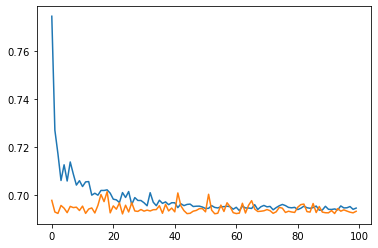

In [51]:
plt.plot(fittedModel.history["loss"])
plt.plot(fittedModel.history["val_loss"])
plt.plot()

[]

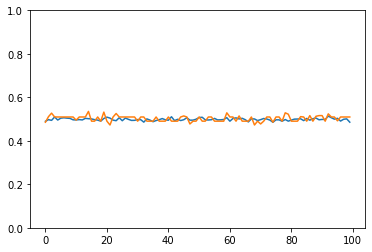

In [52]:
plt.plot(fittedModel.history["accuracy"])
plt.plot(fittedModel.history["val_accuracy"])
plt.ylim(0, 1)
plt.plot()

In [53]:
# load optimal weights
modelDCNET.load_weights(checkpoint_filepath)
# path_name = '/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Models/Full Data/model-dceegnet-open-vs-close'
# modelDCNET.save(path_name)

In [54]:
# new_model = tf.keras.models.load_model(path_name)
y_pred = np.argmax(modelDCNET.predict(X_test), axis=1)  # Softmax
# y_pred = [1 if x > 0.5 else 0 for x in new_model.predict(X_test)]  # Sigmoid
y_true = y_test
test_acc = sum(y_pred == y_true) / len(y_true)
print("Max train and dev: ", max(fittedModel.history["accuracy"]), max(fittedModel.history["val_accuracy"]))
print(f'Test set accuracy main: {test_acc:.0%}')

18/18 [==============================] - 0s 7ms/step
Max train and dev:  0.5136579275131226 0.5352563858032227
Test set accuracy main: 49%


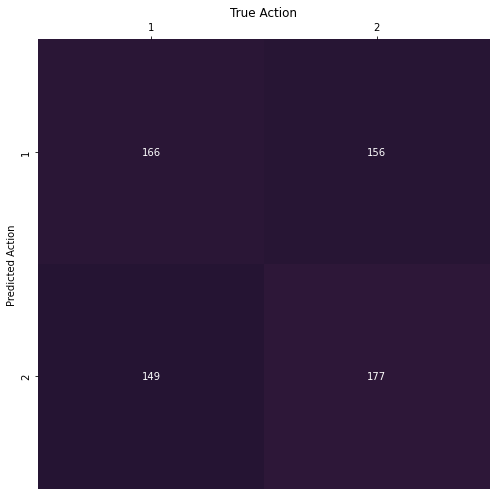

In [97]:
confusion_matrix = tf.math.confusion_matrix(y_true, y_pred)

plt.figure(figsize = (7,7))
hm1 = sns.heatmap(confusion_matrix, annot=True, cbar=False, vmin=0, vmax=1500,fmt='g')

hm1.set(title='True Action', ylabel='Predicted Action')
hm1.xaxis.tick_top()

hm1.set_xticklabels([int(i.get_text())+1 for i in hm1.get_xticklabels()])
hm1.set_yticklabels([int(i.get_text())+1 for i in hm1.get_yticklabels()])
plt.tight_layout()
# file_name = "beat_classification_confusion_matrix_reverse_sizes"
# os.chdir('/mnt/sda1/shivam/DrummingEEG/FullStudyData/images')
# hm1.get_figure().savefig(file_name + ".png")

# EEGNET Subject-wise classification

In [7]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [114]:
# 64 channel EEG data with 500 samples
X, y_oc, y_lr, y_pos, subjs = [], [], [], [], []
grasp_labels = {"Open": 0, "Close": 1}
hand_labels = {"Left": 0, "Right": 1}
pos_dict = {"palmDown": 0, "palmUp": 1, "palmIn": 2}
nchan = 64
iterations = len(dataset) // nchan
# sample_range = 25, 175
for idx in range(iterations):
    start = idx * nchan
    end = (idx + 1) * nchan

    X.append(np.expand_dims(dataset.iloc[start: end, :200], 2))
    subjs.append(dataset.iloc[start, -3])
    y_oc.append(grasp_labels[dataset.iloc[start, -4]])
    y_lr.append(hand_labels[dataset.iloc[start, -5]])
    y_pos.append(pos_dict[dataset.iloc[start, -6]])
    
X = np.array(X)
y_oc = np.array(y_oc)
y_lr = np.array(y_lr)
y_pos = np.array(y_pos)
subjs = np.array(subjs)

X.shape, y_oc.shape, y_lr.shape, y_pos.shape, subjs.shape

((7197, 64, 200, 1), (7197,), (7197,), (7197,), (7197,))

In [129]:
def train_model_EEGNET(X_train, y_train, X_eval, y_eval, epochs, dropoutRate):
    # set a valid path for your system to record model checkpoints
    checkpoint_filepath = "/tmp/checkpoint/"
    checkpointer = ModelCheckpoint(
            filepath=checkpoint_filepath, 
            save_weights_only=True,
            monitor="val_accuracy",
            mode="max",
            save_best_only=True
    )

    model = DeepConvNet(nb_classes = 2, Chans = 64, Samples = 200, dropoutRate=dropoutRate)
    model.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics=['accuracy'])
    fittedModel = model.fit(
        X_train, y_train, epochs=epochs, 
        batch_size=128, validation_data=(X_eval, y_eval), callbacks=[checkpointer], verbose=0
    )
    
    return fittedModel, model, checkpoint_filepath

In [130]:
def test_accuracy(new_model, X_test, y_test, fittedModel):
    y_pred = np.argmax(new_model.predict(X_test), axis=1)  # Softmax
    y_true = y_test
    test_acc = sum(y_pred == y_true) / len(y_true)
    
    print("Max train and dev: ", max(fittedModel.history["accuracy"]), max(fittedModel.history["val_accuracy"]))
    print(f'Test set accuracy: {test_acc:.0%}')
    return y_true, y_pred, test_acc

In [136]:
histories = []
best_model = []
test_accuracies = []

for sub in np.unique(subjs):
#     sub="FP0/1"
    print("###### ", sub, "######")
    
    # Train-test-dev split
    X_train, X_eval, y_train, y_eval = train_test_split(X[subjs==sub], y_oc[subjs==sub], test_size=0.2, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
    
    # Model training
    fittedModel, model, checkpoint_filepath = train_model_EEGNET(
        X_train,
        y_train,
        X_eval,
        y_eval,
        epochs=2000, 
        dropoutRate=0.95
    )
    
    # load optimal weights
    model.load_weights(checkpoint_filepath)

    # Testing model
    y_true, y_pred, test_acc = test_accuracy(model, X_test, y_test, fittedModel)
    
    histories.append(fittedModel)
    best_model.append(model)
    test_accuracies.append(test_acc)

######  FP01 ######


2023-02-16 18:17:22.259747: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_121/dropout_334/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.6710097789764404 0.6145833134651184
Test set accuracy: 49%
######  FP02 ######


2023-02-16 18:20:31.821160: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_122/dropout_338/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8534201979637146 0.6145833134651184
Test set accuracy: 53%
######  FP03 ######


2023-02-16 18:23:42.546494: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_123/dropout_342/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8566775321960449 0.6145833134651184
Test set accuracy: 40%
######  FP05 ######


2023-02-16 18:26:50.635992: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_124/dropout_346/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8622950911521912 0.5625
Test set accuracy: 48%
######  FP06 ######


2023-02-16 18:29:59.403848: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_125/dropout_350/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8697068691253662 0.53125
Test set accuracy: 45%
######  FP07 ######


2023-02-16 18:33:06.839605: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_126/dropout_354/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8566775321960449 0.5416666865348816
Test set accuracy: 49%
######  FP08 ######


2023-02-16 18:36:14.564578: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_127/dropout_358/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8925081491470337 0.5
Test set accuracy: 52%
######  FP09 ######


2023-02-16 18:39:30.475249: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_128/dropout_362/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 5ms/step
Max train and dev:  0.8794788122177124 0.6041666865348816
Test set accuracy: 34%
######  FP10 ######


2023-02-16 18:42:44.162498: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_129/dropout_366/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 5ms/step
Max train and dev:  0.8496732115745544 0.4791666567325592
Test set accuracy: 47%
######  FP11 ######


2023-02-16 18:45:55.644178: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_130/dropout_370/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.7850162982940674 0.6145833134651184
Test set accuracy: 56%
######  FP12 ######


2023-02-16 18:49:05.989119: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_131/dropout_374/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.885993480682373 0.5416666865348816
Test set accuracy: 51%
######  FP13 ######


2023-02-16 18:52:16.166184: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_132/dropout_378/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8566775321960449 0.5729166865348816
Test set accuracy: 56%
######  P01 ######


2023-02-16 18:55:26.235684: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_133/dropout_382/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.8925081491470337 0.625
Test set accuracy: 55%
######  P02 ######


2023-02-16 18:58:35.672421: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_134/dropout_386/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.885993480682373 0.53125
Test set accuracy: 51%
######  P03 ######


2023-02-16 19:01:45.912411: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_135/dropout_390/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - 0s 4ms/step
Max train and dev:  0.9153094291687012 0.6145833134651184
Test set accuracy: 56%


## What is happening!!

In [55]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [6]:
# 64 channel EEG data with 500 samples
X, y_oc, y_lr, y_pos, subjs = [], [], [], [], []
grasp_labels = {"Open": 0, "Close": 1}
hand_labels = {"Left": 0, "Right": 1}
pos_dict = {"palmDown": 0, "palmUp": 1, "palmIn": 2}
nchan = 64
iterations = len(dataset) // nchan
# sample_range = 25, 175
for idx in range(iterations):
    start = idx * nchan
    end = (idx + 1) * nchan

    X.append(np.expand_dims(dataset.iloc[start: end, :200], 2))
    subjs.append(dataset.iloc[start, -3])
    y_oc.append(grasp_labels[dataset.iloc[start, -4]])
    y_lr.append(hand_labels[dataset.iloc[start, -5]])
    y_pos.append(pos_dict[dataset.iloc[start, -6]])
    
X = np.array(X)
y_oc = np.array(y_oc)
y_lr = np.array(y_lr)
y_pos = np.array(y_pos)
subjs = np.array(subjs)

X.shape, y_oc.shape, y_lr.shape, y_pos.shape, subjs.shape

((7197, 64, 200, 1), (7197,), (7197,), (7197,), (7197,))

In [11]:
sub = "P02"
selected_channels = [6, 12, 20, 28, 34, 35, 37, 39, 42, 50, 60]
bad_participants = ["FP01", "FP04", "FP10"]
partial_bad = ["P01"]

In [12]:
X_train, X_eval, y_train, y_eval = train_test_split(X[subjs==sub], y_oc[subjs==sub], test_size=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train.shape, X_eval.shape, X_test.shape, y_train.shape, y_eval.shape, y_test.shape

((388, 64, 200, 1), (48, 64, 200, 1), (44, 64, 200, 1), (388,), (48,), (44,))

In [20]:
checkpoint_filepath = "/tmp/checkpoint/"
checkpointer = ModelCheckpoint(
        filepath=checkpoint_filepath, 
        save_weights_only=True,
        monitor="val_accuracy",
        mode="max",
        save_best_only=True
)

model = EEGNet(nb_classes = 2, Chans = 64, Samples = 200, dropoutRate = 0.5, kernLength = 100)
# model = DeepConvNet(nb_classes = 2, Chans = 64, Samples = 200)
# model = ShallowConvNet(nb_classes = 2, Chans = 64, Samples = 200)

epochs = 500
dropoutRate = 0.8

model.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics=['accuracy'])
fittedModel = model.fit(
    X_train, y_train, epochs=epochs, 
    batch_size=128, validation_data=(X_eval, y_eval), callbacks=[checkpointer]#, verbose=0
)


Epoch 1/500


2023-02-17 12:05:09.882887: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/dropout_7/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


4/4 [==============================] - 2s 92ms/step - loss: 0.7722 - accuracy: 0.5000 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 2/500
4/4 [==============================] - 0s 25ms/step - loss: 0.7023 - accuracy: 0.4897 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/500
4/4 [==============================] - 0s 37ms/step - loss: 0.6924 - accuracy: 0.5335 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 4/500
4/4 [==============================] - 0s 23ms/step - loss: 0.6855 - accuracy: 0.5696 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 5/500
4/4 [==============================] - 0s 28ms/step - loss: 0.6855 - accuracy: 0.5541 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 6/500
4/4 [==============================] - 0s 25ms/step - loss: 0.6808 - accuracy: 0.5696 - val_loss: 0.6932 - val_accuracy: 0.5208
Epoch 7/500
4/4 [==============================] - 0s 35ms/step - loss: 0.6736 - accuracy: 0.5722 - val_loss: 0.6936 - val_accuracy: 0.5417
Epoch 8/500
4/4 [===============

4/4 [==============================] - 0s 25ms/step - loss: 0.5029 - accuracy: 0.7938 - val_loss: 0.8383 - val_accuracy: 0.5208
Epoch 118/500
4/4 [==============================] - 0s 27ms/step - loss: 0.4998 - accuracy: 0.7629 - val_loss: 0.8237 - val_accuracy: 0.5417
Epoch 119/500
4/4 [==============================] - 0s 28ms/step - loss: 0.5109 - accuracy: 0.7603 - val_loss: 0.8087 - val_accuracy: 0.5208
Epoch 120/500
4/4 [==============================] - 0s 25ms/step - loss: 0.5062 - accuracy: 0.7912 - val_loss: 0.8012 - val_accuracy: 0.5208
Epoch 121/500
4/4 [==============================] - 0s 29ms/step - loss: 0.4869 - accuracy: 0.7809 - val_loss: 0.8099 - val_accuracy: 0.5208
Epoch 122/500
4/4 [==============================] - 0s 29ms/step - loss: 0.5136 - accuracy: 0.7552 - val_loss: 0.8020 - val_accuracy: 0.5208
Epoch 123/500
4/4 [==============================] - 0s 24ms/step - loss: 0.5084 - accuracy: 0.7603 - val_loss: 0.7959 - val_accuracy: 0.5000
Epoch 124/500
4/4 [=

Epoch 175/500
4/4 [==============================] - 0s 27ms/step - loss: 0.4612 - accuracy: 0.7990 - val_loss: 0.8022 - val_accuracy: 0.5417
Epoch 176/500
4/4 [==============================] - 0s 28ms/step - loss: 0.4555 - accuracy: 0.8119 - val_loss: 0.7830 - val_accuracy: 0.5417
Epoch 177/500
4/4 [==============================] - 0s 25ms/step - loss: 0.4626 - accuracy: 0.7964 - val_loss: 0.7801 - val_accuracy: 0.5625
Epoch 178/500
4/4 [==============================] - 0s 29ms/step - loss: 0.4565 - accuracy: 0.8196 - val_loss: 0.7834 - val_accuracy: 0.5833
Epoch 179/500
4/4 [==============================] - 0s 26ms/step - loss: 0.4615 - accuracy: 0.7990 - val_loss: 0.7997 - val_accuracy: 0.5625
Epoch 180/500
4/4 [==============================] - 0s 24ms/step - loss: 0.4610 - accuracy: 0.8015 - val_loss: 0.8438 - val_accuracy: 0.5625
Epoch 181/500
4/4 [==============================] - 0s 25ms/step - loss: 0.4702 - accuracy: 0.7887 - val_loss: 0.8689 - val_accuracy: 0.5417
Epoch 

Epoch 233/500
4/4 [==============================] - 0s 25ms/step - loss: 0.4354 - accuracy: 0.8196 - val_loss: 0.9066 - val_accuracy: 0.5625
Epoch 234/500
4/4 [==============================] - 0s 27ms/step - loss: 0.4431 - accuracy: 0.8093 - val_loss: 0.9140 - val_accuracy: 0.5625
Epoch 235/500
4/4 [==============================] - 0s 26ms/step - loss: 0.4353 - accuracy: 0.8067 - val_loss: 0.9065 - val_accuracy: 0.5417
Epoch 236/500
4/4 [==============================] - 0s 28ms/step - loss: 0.4353 - accuracy: 0.8170 - val_loss: 0.8981 - val_accuracy: 0.5417
Epoch 237/500
4/4 [==============================] - 0s 26ms/step - loss: 0.4323 - accuracy: 0.8119 - val_loss: 0.8932 - val_accuracy: 0.5208
Epoch 238/500
4/4 [==============================] - 0s 26ms/step - loss: 0.4326 - accuracy: 0.8093 - val_loss: 0.8869 - val_accuracy: 0.5208
Epoch 239/500
4/4 [==============================] - 0s 28ms/step - loss: 0.4198 - accuracy: 0.8402 - val_loss: 0.8765 - val_accuracy: 0.5208
Epoch 

Epoch 291/500
4/4 [==============================] - 0s 26ms/step - loss: 0.3729 - accuracy: 0.8686 - val_loss: 0.9448 - val_accuracy: 0.5000
Epoch 292/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3890 - accuracy: 0.8582 - val_loss: 0.9387 - val_accuracy: 0.5000
Epoch 293/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3997 - accuracy: 0.8505 - val_loss: 0.9329 - val_accuracy: 0.5208
Epoch 294/500
4/4 [==============================] - 0s 27ms/step - loss: 0.4071 - accuracy: 0.8247 - val_loss: 0.9345 - val_accuracy: 0.5208
Epoch 295/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3720 - accuracy: 0.8660 - val_loss: 0.9371 - val_accuracy: 0.5625
Epoch 296/500
4/4 [==============================] - 0s 26ms/step - loss: 0.3846 - accuracy: 0.8608 - val_loss: 0.9262 - val_accuracy: 0.5625
Epoch 297/500
4/4 [==============================] - 0s 24ms/step - loss: 0.3893 - accuracy: 0.8557 - val_loss: 0.9161 - val_accuracy: 0.5417
Epoch 

Epoch 349/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3629 - accuracy: 0.8531 - val_loss: 0.9023 - val_accuracy: 0.6042
Epoch 350/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3586 - accuracy: 0.8711 - val_loss: 0.9110 - val_accuracy: 0.6250
Epoch 351/500
4/4 [==============================] - 0s 26ms/step - loss: 0.3526 - accuracy: 0.8660 - val_loss: 0.9271 - val_accuracy: 0.6250
Epoch 352/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3447 - accuracy: 0.8918 - val_loss: 0.9393 - val_accuracy: 0.6250
Epoch 353/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3403 - accuracy: 0.8737 - val_loss: 0.9352 - val_accuracy: 0.5833
Epoch 354/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3610 - accuracy: 0.8711 - val_loss: 0.9394 - val_accuracy: 0.5625
Epoch 355/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3444 - accuracy: 0.8892 - val_loss: 0.9279 - val_accuracy: 0.5625
Epoch 

Epoch 407/500
4/4 [==============================] - 0s 26ms/step - loss: 0.3647 - accuracy: 0.8505 - val_loss: 0.9704 - val_accuracy: 0.6250
Epoch 408/500
4/4 [==============================] - 0s 24ms/step - loss: 0.3701 - accuracy: 0.8789 - val_loss: 0.9641 - val_accuracy: 0.6042
Epoch 409/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3574 - accuracy: 0.8686 - val_loss: 0.9647 - val_accuracy: 0.5833
Epoch 410/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3522 - accuracy: 0.8634 - val_loss: 0.9892 - val_accuracy: 0.5625
Epoch 411/500
4/4 [==============================] - 0s 24ms/step - loss: 0.3595 - accuracy: 0.8634 - val_loss: 1.0043 - val_accuracy: 0.5625
Epoch 412/500
4/4 [==============================] - 0s 29ms/step - loss: 0.3333 - accuracy: 0.8840 - val_loss: 0.9892 - val_accuracy: 0.5833
Epoch 413/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3359 - accuracy: 0.8789 - val_loss: 0.9601 - val_accuracy: 0.6042
Epoch 

Epoch 465/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3564 - accuracy: 0.8402 - val_loss: 1.1071 - val_accuracy: 0.5208
Epoch 466/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3367 - accuracy: 0.8660 - val_loss: 1.1077 - val_accuracy: 0.5417
Epoch 467/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3257 - accuracy: 0.8918 - val_loss: 1.1007 - val_accuracy: 0.5625
Epoch 468/500
4/4 [==============================] - 0s 26ms/step - loss: 0.3487 - accuracy: 0.8634 - val_loss: 1.0752 - val_accuracy: 0.5833
Epoch 469/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3516 - accuracy: 0.8737 - val_loss: 1.0491 - val_accuracy: 0.6458
Epoch 470/500
4/4 [==============================] - 0s 25ms/step - loss: 0.3307 - accuracy: 0.8866 - val_loss: 1.0316 - val_accuracy: 0.6042
Epoch 471/500
4/4 [==============================] - 0s 27ms/step - loss: 0.3135 - accuracy: 0.8943 - val_loss: 1.0273 - val_accuracy: 0.5625
Epoch 

In [21]:
model.load_weights(checkpoint_filepath)
y_pred = np.argmax(model.predict(X_test), axis=1)  # Softmax
y_true = y_test
test_acc = sum(y_pred == y_true) / len(y_true)

print("Max train and dev: ", max(fittedModel.history["accuracy"]), max(fittedModel.history["val_accuracy"]))
print(f'Test set accuracy: {test_acc:.0%}')

2/2 [==============================] - 0s 3ms/step
Max train and dev:  0.9226804375648499 0.6666666865348816
Test set accuracy: 50%


In [49]:
# path_name = '/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/Models/Full Data/Subject-wise/model-FP01-eegnet-oc-v2'
# model.save(path_name)

13-Feb-23 17:16:53 | WARNING | Found untraced functions such as _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op while saving (showing 3 of 3). These functions will not be directly callable after loading.


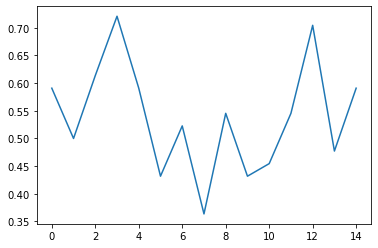

In [43]:
plt.plot(test_accuracies)

# Lazypredict on time-series

In [8]:
os.chdir("/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/CleanSep/")
dataset = pd.read_csv("cleaned_datav2.csv")
dataset

,-100,-96,-92,-88,-84,-80,-76,-72,-68,-64,...,1984,1988,1992,1996,handPos,Hand,Action,Subject,Channel,Trial
0,0.99,1.05,0.82,0.45,0.17,0.09,0.19,0.33,0.45,0.57,...,0.90,1.21,1.48,1.60,palmDown,Right,Open,P01,E1,1
1,2.33,1.83,1.13,0.54,0.25,0.22,0.28,0.33,0.36,0.34,...,1.16,1.76,2.15,2.01,palmDown,Right,Open,P01,E2,1
2,1.47,0.98,0.37,-0.25,-0.77,-1.05,-0.93,-0.34,0.49,1.13,...,3.73,2.26,0.69,-0.24,palmDown,Right,Open,P01,E3,1
3,1.17,0.28,-0.30,-0.42,-0.23,0.08,0.42,0.79,1.07,0.97,...,7.14,6.40,5.57,4.74,palmDown,Right,Open,P01,E4,1
4,2.26,1.37,0.62,0.30,0.37,0.46,0.24,-0.27,-0.79,-1.00,...,-4.01,-3.80,-3.59,-3.45,palmDown,Right,Open,P01,E5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460603,0.30,1.40,2.14,2.10,1.19,-0.18,-1.37,-1.86,-1.57,-0.88,...,-0.04,-0.43,-0.76,-0.83,palmUp,Right,Close,FP12,E60,40
460604,-2.35,-1.60,-0.20,0.96,1.38,1.17,0.72,0.30,-0.01,-0.35,...,0.55,-0.60,-1.46,-1.42,palmUp,Right,Close,FP12,E61,40
460605,-2.92,-1.90,-0.28,0.83,1.03,0.70,0.45,0.57,0.80,0.72,...,1.57,0.31,-0.54,-0.33,palmUp,Right,Close,FP12,E62,40
460606,0.34,0.27,-0.07,-0.42,-0.45,-0.10,0.29,0.34,-0.15,-0.95,...,-0.47,-0.33,-0.23,-0.17,palmUp,Right,Close,FP12,E63,40


In [9]:
# 64 channel EEG data with 500 samples
X, y_oc, y_lr, y_pos, subjs = [], [], [], [], []
grasp_labels = {"Open": 0, "Close": 1}
hand_labels = {"Left": 0, "Right": 1}
pos_dict = {"palmDown": 0, "palmUp": 1, "palmIn": 2}
nchan = 64
iterations = len(dataset) // nchan
# sample_range = 25, 175
for idx in range(iterations):
    start = idx * nchan
    end = (idx + 1) * nchan

    X.append(np.expand_dims(dataset.iloc[start: end, :200], 2))
    subjs.append(dataset.iloc[start, -3])
    y_oc.append(grasp_labels[dataset.iloc[start, -4]])
    y_lr.append(hand_labels[dataset.iloc[start, -5]])
    y_pos.append(pos_dict[dataset.iloc[start, -6]])
    
X = np.array(X)
y_oc = np.array(y_oc)
y_lr = np.array(y_lr)
y_pos = np.array(y_pos)
subjs = np.array(subjs)

X.shape, y_oc.shape, y_lr.shape, y_pos.shape, subjs.shape

((7197, 64, 200, 1), (7197,), (7197,), (7197,), (7197,))

In [23]:
X_train, X_eval, y_train, y_eval = train_test_split(X, y_oc, test_size=0.2, random_state=42)
X_train.shape, X_eval.shape, y_train.shape, y_eval.shape

((5757, 64, 200, 1), (1440, 64, 200, 1), (5757,), (1440,))

In [25]:
X_train.shape

(5757, 64, 200, 1)

In [29]:
X_train_resh = X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2])
X_eval_resh = X_eval.reshape(X_eval.shape[0], X_eval.shape[1] * X_eval.shape[2])
X_train_resh.shape, X_eval_resh.shape

((5757, 12800), (1440, 12800))

In [12]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train_resh, X_eval, y_train, y_eval)

ValueError: Must pass 2-d input. shape=(4605, 64, 200, 1)

# Improving upon EEGNET

In [ ]:
def GRASPNet(nb_classes, Chans = 64, Samples = 256,
                dropoutRate = 0.5):
    """ Keras implementation of the Deep Convolutional Network as described in
    Schirrmeister et. al. (2017), Human Brain Mapping.
    
    This implementation assumes the input is a 2-second EEG signal sampled at 
    128Hz, as opposed to signals sampled at 250Hz as described in the original
    paper. We also perform temporal convolutions of length (1, 5) as opposed
    to (1, 10) due to this sampling rate difference. 
    
    Note that we use the max_norm constraint on all convolutional layers, as 
    well as the classification layer. We also change the defaults for the
    BatchNormalization layer. We used this based on a personal communication 
    with the original authors.
    
                      ours        original paper
    pool_size        1, 2        1, 3
    strides          1, 2        1, 3
    conv filters     1, 5        1, 10
    
    Note that this implementation has not been verified by the original 
    authors. 
    
    """

    # start the model
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(25, (1, 5), 
                                 input_shape=(Chans, Samples, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(25, (Chans, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block1)
    block1       = Activation('elu')(block1)
    block1       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block1)
    block1       = Dropout(dropoutRate)(block1)
  
    block2       = Conv2D(50, (1, 5),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block2       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block2)
    block2       = Activation('elu')(block2)
    block2       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block2)
    block2       = Dropout(dropoutRate)(block2)
    
    block3       = Conv2D(100, (1, 5),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block2)
    block3       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block3)
    block3       = Activation('elu')(block3)
    block3       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block3)
    block3       = Dropout(dropoutRate)(block3)
    
    block4       = Conv2D(200, (1, 5),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block3)
    block4       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block4)
    block4       = Activation('elu')(block4)
    block4       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block4)
    block4       = Dropout(dropoutRate)(block4)
    
    flatten      = Flatten()(block4)
    
    dense        = Dense(nb_classes, kernel_constraint = max_norm(0.5))(flatten)
    softmax      = Activation('softmax')(dense)
    
    return Model(inputs=input_main, outputs=softmax)

# PSD Computation

In [107]:
# 64 channel EEG data with 500 samples
# Giving us X = N * 64 * 275 and y = N 
X, y, y_pos = [], [], []
grasp_labels = {"Open": 0, "Close": 1}
pos_dict = {"palmDown": 0, "palmUp": 1, "palmIn": 2}
nchan = 64
iterations = len(dataset) // nchan
for idx in range(iterations):
    start = idx * nchan
    end = (idx + 1) * nchan

    X.append(np.expand_dims(dataset.iloc[start: end, :201], 2))
    y.append(grasp_labels[dataset.iloc[start, -4]])
    y_pos.append(pos_dict[dataset.iloc[start, -6]])
#     print(len(X), len(y))

X = np.array(X)
y = np.array(y)
y_pos = np.array(y_pos)
X.shape, y.shape, y_pos.shape

((7197, 64, 201, 1), (7197,), (7197,))

In [84]:
# Multitaper method
def bandpower_multitaper(data, sf, method, band, relative=False):
    band = np.asarray(band)
    low, high = band

    if method == 'multitaper':
        psd_trial, freqs = psd_array_multitaper(data, sf, adaptive=True,
                                                normalization='full', verbose=0)
    # Frequency resolution
    freq_res = freqs[1] - freqs[0]

    # Find index of band in frequency vector
    idx_band = np.logical_and(freqs >= low, freqs <= high)

    # Integral approximation of the spectrum using parabola (Simpson's rule)
    bp = simps(psd_trial[idx_band], dx=freq_res)

    return bp


In [85]:
def create_bandpower_features(epochs, frequency):
    bandpower_multitaper_EEG = []
    # Iterating over each subject [20]
    for epoch in epochs:
        # Iterating over each song per subject [30]
        bands_video = []
        no_channels = epoch.shape[0]
        input_brainwaves = epoch
        # Iterating over each channel [14]
        for k in range(no_channels):
            bands_video.append(bandpower_multitaper(input_brainwaves[k,:], sf=frequency, method='multitaper',
                                                    band=[0.5, 4], relative=False))
            bands_video.append(bandpower_multitaper(input_brainwaves[k,:], sf=frequency, method='multitaper',
                                                    band=[4, 7], relative=False))
            bands_video.append(bandpower_multitaper(input_brainwaves[k,:], sf=frequency, method='multitaper',
                                                    band=[8, 13], relative=False))
            bands_video.append(bandpower_multitaper(input_brainwaves[k,:], sf=frequency, method='multitaper',
                                                    band=[14, 30], relative=False))
            bands_video.append(bandpower_multitaper(input_brainwaves[k,:], sf=frequency, method='multitaper',
                                                    band=[31, 50], relative=False))
      
        bandpower_multitaper_EEG.append(bands_video)

    bandpower_multitaper_EEG = np.array(bandpower_multitaper_EEG)
  
    return bandpower_multitaper_EEG

In [89]:
sf = 250
window = 0.8
psd_features = []
for x in X:
    epoch = sliding_window(x[:,:,0], sf=sf, window=window, step=window)[1]
    psd = create_bandpower_features(epoch, sf)
    if len(psd_features) == 0:
        psd_features = psd
    else:
        psd_features = np.concatenate((psd_features, psd))
    print(psd_features.shape)

(1, 320)
(2, 320)
(3, 320)
(4, 320)
(5, 320)
(6, 320)
(7, 320)
(8, 320)
(9, 320)
(10, 320)
(11, 320)
(12, 320)
(13, 320)
(14, 320)
(15, 320)
(16, 320)
(17, 320)
(18, 320)
(19, 320)
(20, 320)
(21, 320)
(22, 320)
(23, 320)
(24, 320)
(25, 320)
(26, 320)
(27, 320)
(28, 320)
(29, 320)
(30, 320)
(31, 320)
(32, 320)
(33, 320)
(34, 320)
(35, 320)
(36, 320)
(37, 320)
(38, 320)
(39, 320)
(40, 320)
(41, 320)
(42, 320)
(43, 320)
(44, 320)
(45, 320)
(46, 320)
(47, 320)
(48, 320)
(49, 320)
(50, 320)
(51, 320)
(52, 320)
(53, 320)
(54, 320)
(55, 320)
(56, 320)
(57, 320)
(58, 320)
(59, 320)
(60, 320)
(61, 320)
(62, 320)
(63, 320)
(64, 320)
(65, 320)
(66, 320)
(67, 320)
(68, 320)
(69, 320)
(70, 320)
(71, 320)
(72, 320)
(73, 320)
(74, 320)
(75, 320)
(76, 320)
(77, 320)
(78, 320)
(79, 320)
(80, 320)
(81, 320)
(82, 320)
(83, 320)
(84, 320)
(85, 320)
(86, 320)
(87, 320)
(88, 320)
(89, 320)
(90, 320)
(91, 320)
(92, 320)
(93, 320)
(94, 320)
(95, 320)
(96, 320)
(97, 320)
(98, 320)
(99, 320)
(100, 320)
(101, 32

(756, 320)
(757, 320)
(758, 320)
(759, 320)
(760, 320)
(761, 320)
(762, 320)
(763, 320)
(764, 320)
(765, 320)
(766, 320)
(767, 320)
(768, 320)
(769, 320)
(770, 320)
(771, 320)
(772, 320)
(773, 320)
(774, 320)
(775, 320)
(776, 320)
(777, 320)
(778, 320)
(779, 320)
(780, 320)
(781, 320)
(782, 320)
(783, 320)
(784, 320)
(785, 320)
(786, 320)
(787, 320)
(788, 320)
(789, 320)
(790, 320)
(791, 320)
(792, 320)
(793, 320)
(794, 320)
(795, 320)
(796, 320)
(797, 320)
(798, 320)
(799, 320)
(800, 320)
(801, 320)
(802, 320)
(803, 320)
(804, 320)
(805, 320)
(806, 320)
(807, 320)
(808, 320)
(809, 320)
(810, 320)
(811, 320)
(812, 320)
(813, 320)
(814, 320)
(815, 320)
(816, 320)
(817, 320)
(818, 320)
(819, 320)
(820, 320)
(821, 320)
(822, 320)
(823, 320)
(824, 320)
(825, 320)
(826, 320)
(827, 320)
(828, 320)
(829, 320)
(830, 320)
(831, 320)
(832, 320)
(833, 320)
(834, 320)
(835, 320)
(836, 320)
(837, 320)
(838, 320)
(839, 320)
(840, 320)
(841, 320)
(842, 320)
(843, 320)
(844, 320)
(845, 320)
(846, 320)

(1460, 320)
(1461, 320)
(1462, 320)
(1463, 320)
(1464, 320)
(1465, 320)
(1466, 320)
(1467, 320)
(1468, 320)
(1469, 320)
(1470, 320)
(1471, 320)
(1472, 320)
(1473, 320)
(1474, 320)
(1475, 320)
(1476, 320)
(1477, 320)
(1478, 320)
(1479, 320)
(1480, 320)
(1481, 320)
(1482, 320)
(1483, 320)
(1484, 320)
(1485, 320)
(1486, 320)
(1487, 320)
(1488, 320)
(1489, 320)
(1490, 320)
(1491, 320)
(1492, 320)
(1493, 320)
(1494, 320)
(1495, 320)
(1496, 320)
(1497, 320)
(1498, 320)
(1499, 320)
(1500, 320)
(1501, 320)
(1502, 320)
(1503, 320)
(1504, 320)
(1505, 320)
(1506, 320)
(1507, 320)
(1508, 320)
(1509, 320)
(1510, 320)
(1511, 320)
(1512, 320)
(1513, 320)
(1514, 320)
(1515, 320)
(1516, 320)
(1517, 320)
(1518, 320)
(1519, 320)
(1520, 320)
(1521, 320)
(1522, 320)
(1523, 320)
(1524, 320)
(1525, 320)
(1526, 320)
(1527, 320)
(1528, 320)
(1529, 320)
(1530, 320)
(1531, 320)
(1532, 320)
(1533, 320)
(1534, 320)
(1535, 320)
(1536, 320)
(1537, 320)
(1538, 320)
(1539, 320)
(1540, 320)
(1541, 320)
(1542, 320)
(154

(2143, 320)
(2144, 320)
(2145, 320)
(2146, 320)
(2147, 320)
(2148, 320)
(2149, 320)
(2150, 320)
(2151, 320)
(2152, 320)
(2153, 320)
(2154, 320)
(2155, 320)
(2156, 320)
(2157, 320)
(2158, 320)
(2159, 320)
(2160, 320)
(2161, 320)
(2162, 320)
(2163, 320)
(2164, 320)
(2165, 320)
(2166, 320)
(2167, 320)
(2168, 320)
(2169, 320)
(2170, 320)
(2171, 320)
(2172, 320)
(2173, 320)
(2174, 320)
(2175, 320)
(2176, 320)
(2177, 320)
(2178, 320)
(2179, 320)
(2180, 320)
(2181, 320)
(2182, 320)
(2183, 320)
(2184, 320)
(2185, 320)
(2186, 320)
(2187, 320)
(2188, 320)
(2189, 320)
(2190, 320)
(2191, 320)
(2192, 320)
(2193, 320)
(2194, 320)
(2195, 320)
(2196, 320)
(2197, 320)
(2198, 320)
(2199, 320)
(2200, 320)
(2201, 320)
(2202, 320)
(2203, 320)
(2204, 320)
(2205, 320)
(2206, 320)
(2207, 320)
(2208, 320)
(2209, 320)
(2210, 320)
(2211, 320)
(2212, 320)
(2213, 320)
(2214, 320)
(2215, 320)
(2216, 320)
(2217, 320)
(2218, 320)
(2219, 320)
(2220, 320)
(2221, 320)
(2222, 320)
(2223, 320)
(2224, 320)
(2225, 320)
(222

(2826, 320)
(2827, 320)
(2828, 320)
(2829, 320)
(2830, 320)
(2831, 320)
(2832, 320)
(2833, 320)
(2834, 320)
(2835, 320)
(2836, 320)
(2837, 320)
(2838, 320)
(2839, 320)
(2840, 320)
(2841, 320)
(2842, 320)
(2843, 320)
(2844, 320)
(2845, 320)
(2846, 320)
(2847, 320)
(2848, 320)
(2849, 320)
(2850, 320)
(2851, 320)
(2852, 320)
(2853, 320)
(2854, 320)
(2855, 320)
(2856, 320)
(2857, 320)
(2858, 320)
(2859, 320)
(2860, 320)
(2861, 320)
(2862, 320)
(2863, 320)
(2864, 320)
(2865, 320)
(2866, 320)
(2867, 320)
(2868, 320)
(2869, 320)
(2870, 320)
(2871, 320)
(2872, 320)
(2873, 320)
(2874, 320)
(2875, 320)
(2876, 320)
(2877, 320)
(2878, 320)
(2879, 320)
(2880, 320)
(2881, 320)
(2882, 320)
(2883, 320)
(2884, 320)
(2885, 320)
(2886, 320)
(2887, 320)
(2888, 320)
(2889, 320)
(2890, 320)
(2891, 320)
(2892, 320)
(2893, 320)
(2894, 320)
(2895, 320)
(2896, 320)
(2897, 320)
(2898, 320)
(2899, 320)
(2900, 320)
(2901, 320)
(2902, 320)
(2903, 320)
(2904, 320)
(2905, 320)
(2906, 320)
(2907, 320)
(2908, 320)
(290

(3509, 320)
(3510, 320)
(3511, 320)
(3512, 320)
(3513, 320)
(3514, 320)
(3515, 320)
(3516, 320)
(3517, 320)
(3518, 320)
(3519, 320)
(3520, 320)
(3521, 320)
(3522, 320)
(3523, 320)
(3524, 320)
(3525, 320)
(3526, 320)
(3527, 320)
(3528, 320)
(3529, 320)
(3530, 320)
(3531, 320)
(3532, 320)
(3533, 320)
(3534, 320)
(3535, 320)
(3536, 320)
(3537, 320)
(3538, 320)
(3539, 320)
(3540, 320)
(3541, 320)
(3542, 320)
(3543, 320)
(3544, 320)
(3545, 320)
(3546, 320)
(3547, 320)
(3548, 320)
(3549, 320)
(3550, 320)
(3551, 320)
(3552, 320)
(3553, 320)
(3554, 320)
(3555, 320)
(3556, 320)
(3557, 320)
(3558, 320)
(3559, 320)
(3560, 320)
(3561, 320)
(3562, 320)
(3563, 320)
(3564, 320)
(3565, 320)
(3566, 320)
(3567, 320)
(3568, 320)
(3569, 320)
(3570, 320)
(3571, 320)
(3572, 320)
(3573, 320)
(3574, 320)
(3575, 320)
(3576, 320)
(3577, 320)
(3578, 320)
(3579, 320)
(3580, 320)
(3581, 320)
(3582, 320)
(3583, 320)
(3584, 320)
(3585, 320)
(3586, 320)
(3587, 320)
(3588, 320)
(3589, 320)
(3590, 320)
(3591, 320)
(359

(4192, 320)
(4193, 320)
(4194, 320)
(4195, 320)
(4196, 320)
(4197, 320)
(4198, 320)
(4199, 320)
(4200, 320)
(4201, 320)
(4202, 320)
(4203, 320)
(4204, 320)
(4205, 320)
(4206, 320)
(4207, 320)
(4208, 320)
(4209, 320)
(4210, 320)
(4211, 320)
(4212, 320)
(4213, 320)
(4214, 320)
(4215, 320)
(4216, 320)
(4217, 320)
(4218, 320)
(4219, 320)
(4220, 320)
(4221, 320)
(4222, 320)
(4223, 320)
(4224, 320)
(4225, 320)
(4226, 320)
(4227, 320)
(4228, 320)
(4229, 320)
(4230, 320)
(4231, 320)
(4232, 320)
(4233, 320)
(4234, 320)
(4235, 320)
(4236, 320)
(4237, 320)
(4238, 320)
(4239, 320)
(4240, 320)
(4241, 320)
(4242, 320)
(4243, 320)
(4244, 320)
(4245, 320)
(4246, 320)
(4247, 320)
(4248, 320)
(4249, 320)
(4250, 320)
(4251, 320)
(4252, 320)
(4253, 320)
(4254, 320)
(4255, 320)
(4256, 320)
(4257, 320)
(4258, 320)
(4259, 320)
(4260, 320)
(4261, 320)
(4262, 320)
(4263, 320)
(4264, 320)
(4265, 320)
(4266, 320)
(4267, 320)
(4268, 320)
(4269, 320)
(4270, 320)
(4271, 320)
(4272, 320)
(4273, 320)
(4274, 320)
(427

(4875, 320)
(4876, 320)
(4877, 320)
(4878, 320)
(4879, 320)
(4880, 320)
(4881, 320)
(4882, 320)
(4883, 320)
(4884, 320)
(4885, 320)
(4886, 320)
(4887, 320)
(4888, 320)
(4889, 320)
(4890, 320)
(4891, 320)
(4892, 320)
(4893, 320)
(4894, 320)
(4895, 320)
(4896, 320)
(4897, 320)
(4898, 320)
(4899, 320)
(4900, 320)
(4901, 320)
(4902, 320)
(4903, 320)
(4904, 320)
(4905, 320)
(4906, 320)
(4907, 320)
(4908, 320)
(4909, 320)
(4910, 320)
(4911, 320)
(4912, 320)
(4913, 320)
(4914, 320)
(4915, 320)
(4916, 320)
(4917, 320)
(4918, 320)
(4919, 320)
(4920, 320)
(4921, 320)
(4922, 320)
(4923, 320)
(4924, 320)
(4925, 320)
(4926, 320)
(4927, 320)
(4928, 320)
(4929, 320)
(4930, 320)
(4931, 320)
(4932, 320)
(4933, 320)
(4934, 320)
(4935, 320)
(4936, 320)
(4937, 320)
(4938, 320)
(4939, 320)
(4940, 320)
(4941, 320)
(4942, 320)
(4943, 320)
(4944, 320)
(4945, 320)
(4946, 320)
(4947, 320)
(4948, 320)
(4949, 320)
(4950, 320)
(4951, 320)
(4952, 320)
(4953, 320)
(4954, 320)
(4955, 320)
(4956, 320)
(4957, 320)
(495

(5558, 320)
(5559, 320)
(5560, 320)
(5561, 320)
(5562, 320)
(5563, 320)
(5564, 320)
(5565, 320)
(5566, 320)
(5567, 320)
(5568, 320)
(5569, 320)
(5570, 320)
(5571, 320)
(5572, 320)
(5573, 320)
(5574, 320)
(5575, 320)
(5576, 320)
(5577, 320)
(5578, 320)
(5579, 320)
(5580, 320)
(5581, 320)
(5582, 320)
(5583, 320)
(5584, 320)
(5585, 320)
(5586, 320)
(5587, 320)
(5588, 320)
(5589, 320)
(5590, 320)
(5591, 320)
(5592, 320)
(5593, 320)
(5594, 320)
(5595, 320)
(5596, 320)
(5597, 320)
(5598, 320)
(5599, 320)
(5600, 320)
(5601, 320)
(5602, 320)
(5603, 320)
(5604, 320)
(5605, 320)
(5606, 320)
(5607, 320)
(5608, 320)
(5609, 320)
(5610, 320)
(5611, 320)
(5612, 320)
(5613, 320)
(5614, 320)
(5615, 320)
(5616, 320)
(5617, 320)
(5618, 320)
(5619, 320)
(5620, 320)
(5621, 320)
(5622, 320)
(5623, 320)
(5624, 320)
(5625, 320)
(5626, 320)
(5627, 320)
(5628, 320)
(5629, 320)
(5630, 320)
(5631, 320)
(5632, 320)
(5633, 320)
(5634, 320)
(5635, 320)
(5636, 320)
(5637, 320)
(5638, 320)
(5639, 320)
(5640, 320)
(564

(6241, 320)
(6242, 320)
(6243, 320)
(6244, 320)
(6245, 320)
(6246, 320)
(6247, 320)
(6248, 320)
(6249, 320)
(6250, 320)
(6251, 320)
(6252, 320)
(6253, 320)
(6254, 320)
(6255, 320)
(6256, 320)
(6257, 320)
(6258, 320)
(6259, 320)
(6260, 320)
(6261, 320)
(6262, 320)
(6263, 320)
(6264, 320)
(6265, 320)
(6266, 320)
(6267, 320)
(6268, 320)
(6269, 320)
(6270, 320)
(6271, 320)
(6272, 320)
(6273, 320)
(6274, 320)
(6275, 320)
(6276, 320)
(6277, 320)
(6278, 320)
(6279, 320)
(6280, 320)
(6281, 320)
(6282, 320)
(6283, 320)
(6284, 320)
(6285, 320)
(6286, 320)
(6287, 320)
(6288, 320)
(6289, 320)
(6290, 320)
(6291, 320)
(6292, 320)
(6293, 320)
(6294, 320)
(6295, 320)
(6296, 320)
(6297, 320)
(6298, 320)
(6299, 320)
(6300, 320)
(6301, 320)
(6302, 320)
(6303, 320)
(6304, 320)
(6305, 320)
(6306, 320)
(6307, 320)
(6308, 320)
(6309, 320)
(6310, 320)
(6311, 320)
(6312, 320)
(6313, 320)
(6314, 320)
(6315, 320)
(6316, 320)
(6317, 320)
(6318, 320)
(6319, 320)
(6320, 320)
(6321, 320)
(6322, 320)
(6323, 320)
(632

(6924, 320)
(6925, 320)
(6926, 320)
(6927, 320)
(6928, 320)
(6929, 320)
(6930, 320)
(6931, 320)
(6932, 320)
(6933, 320)
(6934, 320)
(6935, 320)
(6936, 320)
(6937, 320)
(6938, 320)
(6939, 320)
(6940, 320)
(6941, 320)
(6942, 320)
(6943, 320)
(6944, 320)
(6945, 320)
(6946, 320)
(6947, 320)
(6948, 320)
(6949, 320)
(6950, 320)
(6951, 320)
(6952, 320)
(6953, 320)
(6954, 320)
(6955, 320)
(6956, 320)
(6957, 320)
(6958, 320)
(6959, 320)
(6960, 320)
(6961, 320)
(6962, 320)
(6963, 320)
(6964, 320)
(6965, 320)
(6966, 320)
(6967, 320)
(6968, 320)
(6969, 320)
(6970, 320)
(6971, 320)
(6972, 320)
(6973, 320)
(6974, 320)
(6975, 320)
(6976, 320)
(6977, 320)
(6978, 320)
(6979, 320)
(6980, 320)
(6981, 320)
(6982, 320)
(6983, 320)
(6984, 320)
(6985, 320)
(6986, 320)
(6987, 320)
(6988, 320)
(6989, 320)
(6990, 320)
(6991, 320)
(6992, 320)
(6993, 320)
(6994, 320)
(6995, 320)
(6996, 320)
(6997, 320)
(6998, 320)
(6999, 320)
(7000, 320)
(7001, 320)
(7002, 320)
(7003, 320)
(7004, 320)
(7005, 320)
(7006, 320)
(700

In [90]:
os.chdir('/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/IntData/')
np.save("psd_features_v2_2full.npy", psd_features)

In [91]:
os.chdir('/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/IntData/')
psd_labels = []
for label in y:
    psd_labels += [label] * 1
np.save("psd_labels_v2_2full.npy", psd_labels)

# PSD Classification

In [109]:
os.chdir('/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/IntData/')
X, y = np.load("psd_features_v2_2full.npy"), np.load("psd_labels_v2_2full.npy")
X.shape, y.shape # ((1920, 320), (1920,))

((7197, 320), (7197,))

Perplexity:  0


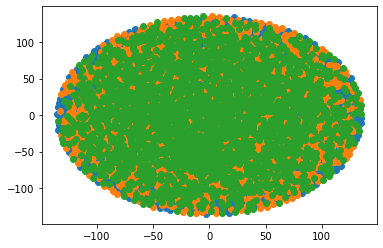

Perplexity:  4


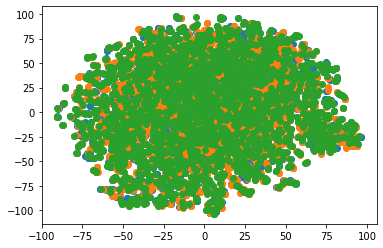

Perplexity:  8


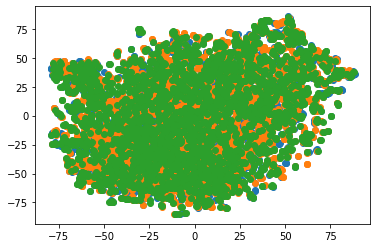

Perplexity:  12


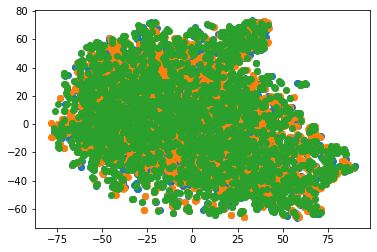

Perplexity:  16


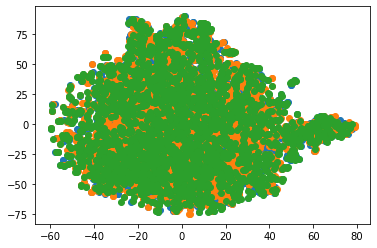

Perplexity:  20


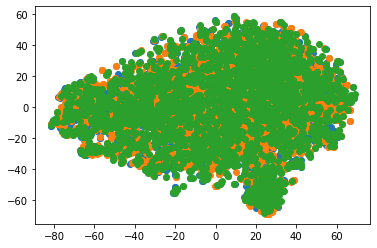

Perplexity:  24


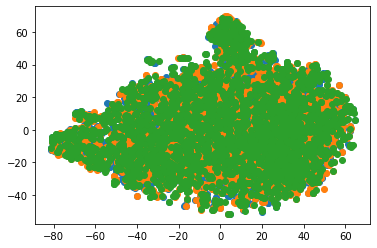

Perplexity:  28


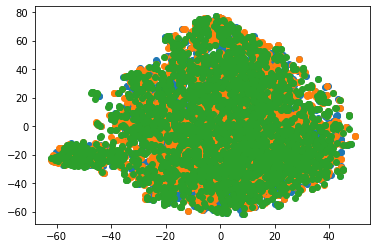

Perplexity:  32


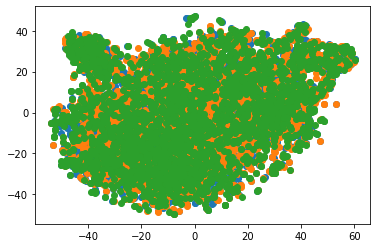

Perplexity:  36


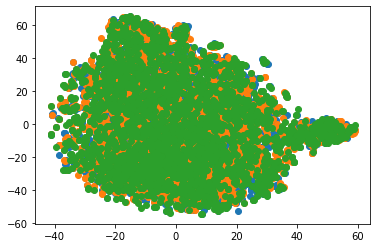

Perplexity:  40


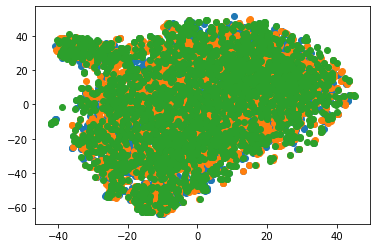

In [111]:
from sklearn.manifold import TSNE
tsne = TSNE()
perplexity = range(0, 41, 4)
for per in perplexity:
    dataset_embedded = TSNE(
        n_components=2, 
        learning_rate="auto", 
        init="random", 
        perplexity=per
    ).fit_transform(X)
    
    print("Perplexity: ", per)
    plt.scatter(dataset_embedded[y_pos==0,0], dataset_embedded[y_pos==0,1])
    plt.scatter(dataset_embedded[y_pos==1,0], dataset_embedded[y_pos==1,1])
    plt.scatter(dataset_embedded[y_pos==2,0], dataset_embedded[y_pos==2,1])
    plt.show()

In [29]:
dataset_embedded = TSNE(
        n_components=2, 
        learning_rate="auto", 
        init="random", 
        perplexity=per
    ).fit_transform(X)

In [30]:
dataset_embedded.shape, dataset_embedded

((7197, 2),
 array([[ 34.71756 , -40.076725],
        [ 17.756315, -30.676785],
        [  7.273998, -37.59327 ],
        ...,
        [-10.127783,  18.079062],
        [  4.499216,   8.318441],
        [-12.250103,  16.408005]], dtype=float32))

In [33]:
dataset_embedded[y==1].shape

(3597, 2)

In [95]:
X_train, X_eval, y_train, y_eval = train_test_split(X, y, test_size=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train.shape, X_eval.shape, X_test.shape, y_train.shape, y_eval.shape, y_test.shape

((5829, 320), (720, 320), (648, 320), (5829,), (720,), (648,))

In [96]:
# https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import cross_val_score

In [102]:
# source : https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

clfs = [
    KNeighborsClassifier(2),
    # SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    # GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=2000),
    RandomForestClassifier(max_depth=2000, n_estimators=200, max_features="auto"),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

names = [
    "Nearest Neighbors",
    # "Linear SVM",
    "RBF SVM",
    # "Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

clfs_mlp = [
    MLPClassifier(hidden_layer_sizes=(10, 20, 10), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(20, 40, 30), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(30, 60, 45), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(40, 80, 60), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(60, 120, 80), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(80, 140, 100), alpha=0.01, max_iter=1000),
]

names_mlp = [
    "MLP1",
    "MLP2",
    "MLP3",
    "MLP4",
    "MLP5",
    "MLP6",
]

In [100]:
chans = [6, 12, 20, 28, 34, 35, 37, 39, 42, 50, 60]
feature_idx = []
for chan in chans:
    start, end = 5 * (chan), (chan+1) * 5
    feature_idx += range(start, end+1)
len(feature_idx)

66

In [103]:
results = []
for idx,clf in enumerate(clfs):
    clf.fit(X_train[:, feature_idx], y_train)
    score = clf.score(X_test[:, feature_idx], y_test)
    results.append([names[idx], score])
    print(names[idx], score)

Nearest Neighbors 0.48148148148148145
RBF SVM 0.5015432098765432
Decision Tree 0.5123456790123457
Random Forest 0.5092592592592593
Neural Net 0.5601851851851852
AdaBoost 4.9691358024691357e-01
Naive Bayes 0.5246913580246914
QDA 0.5123456790123457


In [42]:
# Based on channel selection, 8 channels at a time. Then we go for iteratively increasing channels.
chan_sel_results = []
# clf = KNeighborsClassifier(2)
chunk = 64
chan_sel_results = np.array([[x] for x in names])
for i in range(64//chunk):
    start = i * chunk * 5
    end = (i+1) * chunk * 5
    score_chunk = []
    for idx,clf in enumerate(clfs):
        clf.fit(X_train[:, start:end], y_train)
        score = clf.score(X_test[:, start:end], y_test)
        score_chunk.append(score)
    score_chunk = np.array([[x] for x in score_chunk])
    chan_sel_results = np.append(chan_sel_results, score_chunk, axis=1)
chan_sel_results.shape, chan_sel_results

((8, 2),
 array([['Nearest Neighbors', '0.5123456790123457'],
        ['RBF SVM', '0.49691358024691357'],
        ['Decision Tree', '0.5015432098765432'],
        ['Random Forest', '0.5354938271604939'],
        ['Neural Net', '0.5478395061728395'],
        ['AdaBoost', '0.5447530864197531'],
        ['Naive Bayes', '0.5200617283950617'],
        ['QDA', '0.5385802469135802']], dtype='<U32'))

# Left vs Right [NAiBS]

In [130]:
# source : https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

clfs = [
    KNeighborsClassifier(2),
    # SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    # GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=200),
    RandomForestClassifier(max_depth=200, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

names = [
    "KNN",
    # "Linear SVM",
    "RBF SVM",
    # "Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

clfs_mlp = [
    MLPClassifier(hidden_layer_sizes=(10, 20, 10), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(20, 40, 30), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(30, 60, 45), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(40, 80, 60), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(60, 120, 80), alpha=0.01, max_iter=1000),
    MLPClassifier(hidden_layer_sizes=(80, 140, 100), alpha=0.01, max_iter=1000),
]

names_mlp = [
    "MLP1",
    "MLP2",
    "MLP3",
    "MLP4",
    "MLP5",
    "MLP6",
]

In [131]:
os.chdir('/mnt/sda1/shivam/Thesis/Grasp Experiment/Data/IntData/')
X, y = np.load("psd_features_v2_1.npy"), np.load("psd_labels_lr_v2_1.npy")
X.shape, y.shape # ((1920, 320), (1920,))

((1209, 128), (1209,))

In [132]:
X_train, X_eval, y_train, y_eval = train_test_split(X, y, test_size=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train.shape, X_eval.shape, X_test.shape, y_train.shape, y_eval.shape, y_test.shape

((979, 128), (121, 128), (109, 128), (979,), (121,), (109,))

In [133]:
results = []
for idx,clf in enumerate(clfs):
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    results.append([names[idx], score])
    print(names[idx], score)

KNN 0.8256880733944955
RBF SVM 0.45871559633027525
Decision Tree 0.9174311926605505
Random Forest 0.7706422018348624
Neural Net 0.926605504587156
AdaBoost 9.357798165137615e-01
Naive Bayes 0.6330275229357798
QDA 0.7706422018348624


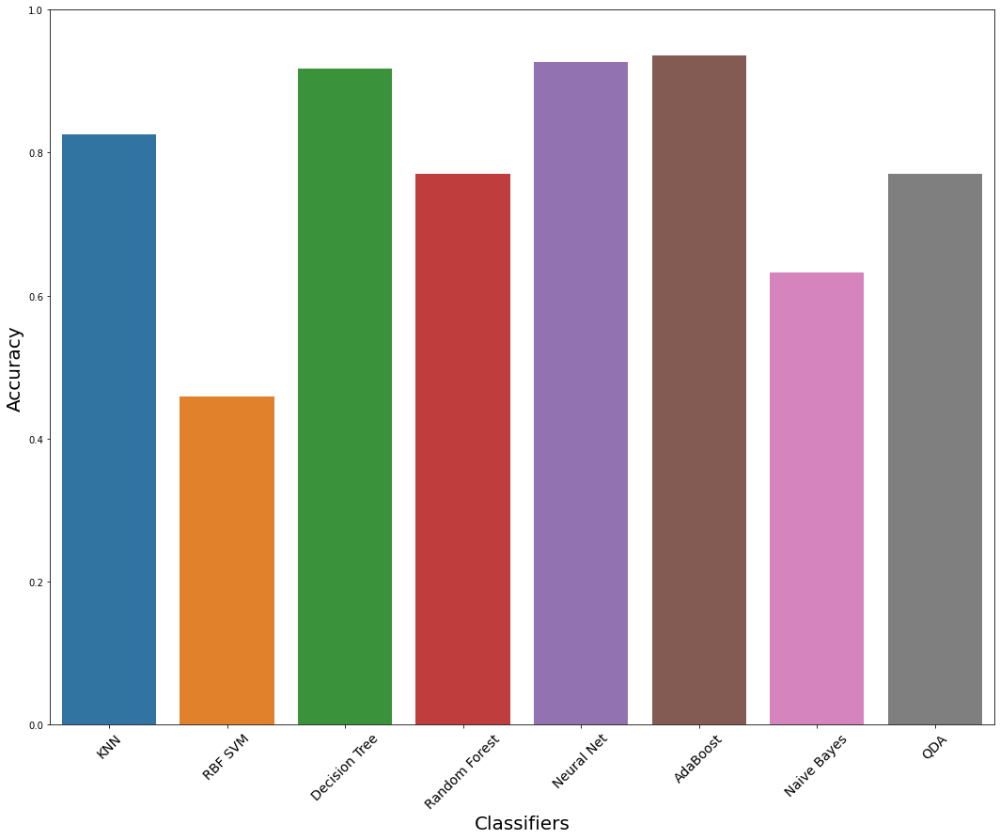

In [142]:
plt.figure(figsize=(18, 14))
sns.barplot([res[0] for res in results], [res[1] for res in results])
plt.xlabel("Classifiers", size=20)
plt.ylabel("Accuracy", size=20)
plt.xticks(rotation=45, size=14)
plt.savefig("Left-vs-right-grasp.png")
plt.ylim((0, 1))
plt.show()